### Packages

In [1]:
# cd /project/3022057.01/IFA
# module load anaconda3
# source activate IFAenv
# jupyter notebook --no-browser --ip=* --port=8888 --NotebookApp.token=''

import os
import random
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.linalg import eigh
from sklearn.decomposition import FastICA, PCA
from sklearn.manifold import MDS
from nilearn import plotting as nplot
from nilearn import image as nimg
from nilearn import datasets, plotting
from nilearn.regions import connected_label_regions
from nilearn import input_data
from nilearn import image as nimg
from nilearn.connectome import ConnectivityMeasure

/home/mrstats/zaisou/.local/lib/python3.10/site-packages/nilearn/input_data/__init__.py:23: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


### Helper Functions

In [2]:
# https://dartbrains.org/content/Parcellations.html#summary-of-differences-between-parcellations
# https://nipy.org/nibabel/nibabel_images.html
# https://nilearn.github.io/dev/auto_examples/03_connectivity/plot_signal_extraction.html
# https://nilearn.github.io/dev/modules/generated/nilearn.regions.Parcellations.html
# https://dartbrains.org/content/Parcellations.html#nilearn
# https://carpentries-incubator.github.io/SDC-BIDS-fMRI/aio/index.html
def create_mask(dir='../resources/rois/',n_rois=200, yeo_networks=17, resolution_mm=1):
    if dir == '../resources/rois/':
        parcel_dir = dir
        schaefer = datasets.fetch_atlas_schaefer_2018(n_rois,yeo_networks,resolution_mm,data_dir=parcel_dir)
        atlas_schaefer = schaefer['maps']
        atlas = connected_label_regions(atlas_schaefer)
    else:
        atlas = dir
    masker = input_data.NiftiLabelsMasker(labels_img=atlas,
                                        standardize=True)
    atlas_img = nimg.load_img(atlas)
    region_labels = np.unique(atlas_img.get_fdata())
    region_labels = np.setdiff1d(region_labels, [0])

    return masker, atlas, region_labels

In [3]:
def view_labels(atlas,roi = 'a == 1'):
    # View rois
    nplot.plot_roi(atlas,
                cut_coords=(-20,-10,0,10,20,30,40,50,60,70),
                display_mode='z',
                colorbar=True,
                cmap='Paired')
    
    # Make a mask for ROI 44
    roi_mask = nimg.math_img(roi, a=atlas)  
    # Visualize ROI
    nplot.plot_roi(roi_mask)
    

In [4]:
def view_data_labels(sub_data,region_labels):
    # View sub data at 4th sample
    nplot.view_img(sub_data.slicer[:,:,:,4])
        
    # Resample rois to match sub_data
    print("Size of functional image:", sub_data.shape)
    print("Size of atlas image:", region_labels.shape)
    resampled_schaefer = nimg.resample_to_img(region_labels, sub_data)
    print("Size of resampled atlas image:", resampled_schaefer.shape)

    # View different overlays of roi and subdata at 1000th sample
    nplot.plot_roi(resampled_schaefer, sub_data.slicer[:, :, :, 1000])
    nplot.view_img(resampled_schaefer,sub_data.slicer[:, :, :, 1000])

In [5]:
def parcellate(sub_data, masker, region_labels, verbose=False):
    # Create parcellated data
    parcellated = masker.fit_transform(sub_data)
    num_labels = len(region_labels)
    
    # where t is the number of timepoints
    num_timepoints = sub_data.shape[3]
    # Create an array of zeros that has the correct size
    final_signal = np.zeros((num_timepoints, num_labels))

    # Get regions that are kept
    regions_kept = np.array(masker.labels_,dtype='int')

    # Fill columns matching labels with signal values
    final_signal[:, regions_kept-1] = parcellated
    if verbose:
        print("Number of atlas labels: ", num_labels)
        print("Number of parcellated labels: ", len(masker.labels_))
        print("Missing labels: ", set(region_labels) - set(np.unique(masker.labels_)))
    return final_signal

In [6]:
def parcellate_all(allsubs, mask, region_labels, save=False,verbose=False,location=''):
    main_output_directory = os.path.normpath(r"/project/3022057.01/")

    alldata = []
    for sub in allsubs:
        for task in sub:
            if verbose:
                print(task)
            sub_data = nimg.load_img(task)
            parcellated = parcellate(sub_data, mask, region_labels, verbose=verbose)
            alldata.append(parcellated)
            if save:
                subdir = task[task.find("S1200") + len("S1200"):].split("/")[1]
                taskdir = task[task.find("Results") + len("Results"):].split("/")[1]
                sub_output_directory = os.path.join(main_output_directory, location,subdir)
                os.makedirs(sub_output_directory, exist_ok=True)
                output_filename = os.path.join(sub_output_directory, f"{taskdir}_parcellated.npy")
                print(output_filename)
                np.save(output_filename, parcellated)
    return alldata 

In [7]:
import warnings
def standardize_demean(group):
    if np.isnan(group).any():
        # If NaNs are present, replace them with zeros
        group = np.nan_to_num(group)
        print("Warning: NaNs found in the data. Replacing with zeros.")
        
    preprocessed_group = np.zeros_like(group)

    for i, subject in enumerate(group):
        # parcels_means = np.mean(subject,axis=1,keepdims=True)
        # standardized_subject = subject - parcels_means

        # time_series_means = np.mean(standardized_subject,axis=0,keepdims=True)
        # time_series_std = np.std(standardized_subject,axis=0,ddof=1)
        # standardized_subject = (standardized_subject-time_series_means)/ time_series_std
        
        time_series_means = np.mean(subject,axis=0,keepdims=True)
        time_series_std = np.std(subject,axis=0,ddof=1)
        epsilon = 1e-11
        time_series_std = np.where(time_series_std < epsilon, epsilon, time_series_std)
        with warnings.catch_warnings():
            warnings.filterwarnings('error', category=RuntimeWarning)
            try:
                standardized_subject = (subject - time_series_means) / time_series_std
            except RuntimeWarning as warning:
                print("Warning encountered at subject", i)
                print("RuntimeWarning:", warning)
                print("Values causing the warning:")
                print("time_series_std:", time_series_std)
            
        preprocessed_group[i,:,:] = standardized_subject

    return preprocessed_group


In [8]:
from scipy.signal import sawtooth

def create_signal(samples, parcels, sig_freq=.1, spatial_ratio=.1, temporal_ratio=.1, amp=1, type="saw", visualize=False):

    # Create a random subset of parcels to add the signal
    num_parcels_with_signal = int(spatial_ratio * parcels)
    groupA_parcels = np.random.choice(parcels, size=num_parcels_with_signal, replace=False)
    groupB_parcels = np.random.choice(np.setdiff1d(np.arange(parcels), groupA_parcels), size=num_parcels_with_signal, replace=False)

    x = np.linspace(0, samples, num=samples)
    if type == "sin":
        signal = temporal_ratio * amp * np.sin(sig_freq * x)
    else:
        signal = temporal_ratio * amp * sawtooth(sig_freq * x)

    parcelsA = np.zeros((samples, parcels))
    parcelsB = np.zeros((samples, parcels))

    # Add the signal to the selected parcels
    parcelsA[:, groupA_parcels] += np.reshape(signal, (-1, 1))
    parcelsB[:, groupB_parcels] += np.reshape(signal, (-1, 1))

    if visualize:
        # Plot heatmap
        plt.figure(figsize=(12, 12))
        plt.subplot(3,1,1)
        plt.imshow(parcelsA.T, aspect='auto', cmap='viridis', origin='lower')
        plt.colorbar(label='Amplitude')
        plt.title('Heatmap of Genarated Group A fMRI Matrix')
        plt.xlabel('Samples')
        plt.ylabel('Parcels')
        
        plt.subplot(3,1,2)
        plt.imshow(parcelsB.T, aspect='auto', cmap='viridis', origin='lower')
        plt.colorbar(label='Amplitude')
        plt.title('Heatmap of Genarated Group B fMRI Matrix')
        plt.xlabel('Samples')
        plt.ylabel('Parcels')

        # Plot each parcel as a line plot
        plt.subplot(3,1,3)
        plt.plot(signal)
        plt.title('Signal in Selected Parcels')
        plt.xlabel('Samples')
        plt.ylabel('Amplitude')
        plt.tight_layout()
        plt.show()

    return signal, groupA_parcels, groupB_parcels

In [9]:
def simulate_data(allsubs_data, sig_freq=.03, spatial_ratio=.01, temporal_ratio=.8, sub_ratio=.5, noise_level=0.01, shared_level=0.0, simulateA=True, simulateB=True):
    samples = allsubs_data[0].shape[0]
    parcels = allsubs_data[0].shape[1]
    amp = np.max(allsubs_data[0])
    simulated_signal, groupA_parcels, groupB_parcels = create_signal(samples,parcels, sig_freq=sig_freq,spatial_ratio=spatial_ratio,temporal_ratio=temporal_ratio,amp=amp,type="saw", visualize=True)
    
    nsubjects = len(allsubs_data)
    nsubjects_semi_simulated = int(nsubjects*sub_ratio)

    selected_subjects = np.random.choice(nsubjects, size=nsubjects_semi_simulated, replace=False)
    unselected_subjects = np.array(np.setdiff1d(np.arange(nsubjects),selected_subjects))

    groupA_data = allsubs_data[selected_subjects,:,:].copy()
    groupB_data = allsubs_data[unselected_subjects,:,:].copy()
    
    if simulateA:
        for i, subject in enumerate(groupA_data):
            for parcel in groupA_parcels:
                groupA_data[i,:,parcel] = shared_level*subject[:,parcel] + simulated_signal + noise_level * np.random.rand(samples)
    
        groupB_data[:,:,groupA_parcels] = shared_level*groupB_data[:,:,groupA_parcels] + 0.0

    if simulateB:
        for i, subject in enumerate(groupB_data):
            for parcel in groupB_parcels:
                groupB_data[i,:,parcel] = shared_level*subject[:,parcel] + simulated_signal + noise_level * np.random.rand(samples)

        groupA_data[:,:,groupB_parcels] = shared_level*groupA_data[:,:,groupB_parcels] + 0.0

    return groupA_data, groupB_data

In [10]:
def load(n=0,folder1=0,folder2=-1):
    # Min and max number of subjects
    if n < 0:
        n = 0
    elif n > 1113:
        n = 1113

    # Define the directory where the data is stored
    base_directory = "/project_cephfs/3022017.01/S1200"
    subdirectory = "MNINonLinear/Results"
    
    # Define the list of folders for rfMRI and tfMRI
    folders = ["rfMRI_REST1_LR","rfMRI_REST1_RL","rfMRI_REST2_LR","rfMRI_REST2_RL","tfMRI_EMOTION_LR",
                    "tfMRI_EMOTION_RL","tfMRI_GAMBLING_LR","tfMRI_GAMBLING_RL","tfMRI_LANGUAGE_LR","tfMRI_LANGUAGE_RL",
                        "tfMRI_MOTOR_LR", "tfMRI_MOTOR_RL", "tfMRI_RELATIONAL_LR", "tfMRI_RELATIONAL_RL", "tfMRI_SOCIAL_LR",
                            "tfMRI_SOCIAL_RL", "tfMRI_WM_LR", "tfMRI_WM_RL"]
    
    # Randomly select n subjects without repetition
    selected_subjects = set()
    while len(selected_subjects) < n:
        subject = random.choice(os.listdir(base_directory))
        subject_data1 = os.path.join(base_directory, subject, subdirectory, folders[folder1], folders[folder1] + ".nii.gz")

        # Check if the file exists before adding the subject
        if os.path.exists(subject_data1):
            if folder2 > 0:
                subject_data2 = os.path.join(base_directory, subject, subdirectory, folders[folder2],folders[folder2] + ".nii.gz")
                # Check if the second file exists before adding it
                if os.path.exists(subject_data2):
                    selected_subjects.add((subject_data1, subject_data2))
            else:
                selected_subjects.add((subject_data1,))

    return [list(sub) for sub in selected_subjects]

In [11]:
from sklearn.covariance import LedoitWolf

def regcov(data, gamma=0.0001, sc=1.0, beta=0.0, ddof=1.0, groundtruth=None):
    # # TODO parallelize and remove for loops or use Leidot wolf
    #     Lcov = LedoitWolf().fit(np.squeeze(data[sub,:,:]).T)
    #     covs[sub,:,:]=Lcov.covariance_
    # Initialize arrays to store the regularized covariance matrices for each subject
    # Compute the ground truth covariance matrices for each group (before adding noise)
    samples = data.shape[0]
    parcels =  data.shape[1]

    if groundtruth:
        groundtruthC = groundtruth.T@groundtruth
    else:
        groundtruthC = np.zeros((parcels, parcels))
        
    subdata_demean = data - np.mean(data,axis=1,keepdims=True)

    subC = subdata_demean.T@subdata_demean
    subC = data.T@data
    I = np.identity(parcels)  # Identity matrix of the same size as subC
    # Apply the second regularization term using the ground truth covariance matrices
    Chat = (1.0 - beta) * sc * subC + beta * groundtruthC
    # Apply regularization to the initial covariance matrices
    Creg = (1.0 - gamma) * Chat + gamma * I
    Creg = Creg/(samples-ddof)
    # Creg = LedoitWolf().fit(subdata_demean)
    # return Creg.covariance_
    return Creg

In [12]:
def numerical_stability(groupA_cov, groupB_cov):
    
    # Method 1
    C = groupA_cov+groupB_cov
    eigs, vecs = eigh(C)
    P = np.diag(np.power(eigs,-.5))@vecs.T
    S1 = P@groupA_cov@P.T
    S2 = P@groupB_cov@P.T

    groupA_eigs1, groupA_filters1 = eigh(S1,eigvals_only=False)
    groupB_eigs1, groupB_filters1 = eigh(S2,eigvals_only=False)

    # Method 2
    groupA_eigs2, groupA_filters2 = eigh(np.linalg.inv(groupA_cov+groupB_cov)@groupA_cov,eigvals_only=False)
    groupB_eigs2, groupB_filters2 = eigh(np.linalg.inv(groupA_cov+groupB_cov)@groupB_cov,eigvals_only=False)

    # Method 3
    groupA_eigs3, groupA_filters3 = eigh(groupA_cov, groupA_cov+groupB_cov,eigvals_only=False)
    groupB_eigs3, groupB_filters3 = eigh(groupB_cov, groupA_cov+groupB_cov,eigvals_only=False)

    return  groupA_eigs1, groupA_filters1, groupB_eigs1, groupB_filters1, groupA_eigs2, groupA_filters2, groupB_eigs2, groupB_filters2, groupA_eigs3, groupA_filters3, groupB_eigs3, groupB_filters3
    

In [13]:
def FKT(groupA_cov, groupB_cov, ngroupA_filters=0, ngroupB_filters=0, auto_select=True, threshold=.8, visualize=True):
    rank = groupA_cov.shape[0]

    ## Theoretically Equivalent methods to calculate the filters 
    # C = groupA_cov+groupB_cov
    # eigs, vecs = eigh(C)
    # P = np.diag(np.power(eigs,-.5))@vecs.T
    # S1 = P@groupA_cov@P.T
    # S2 = P@groupB_cov@P.T
    # groupA_eigs, groupA_filters = eigh(S1,eigvals_only=False,subset_by_value=[threshold,1.0])
    # groupB_eigs, groupB_filters = eigh(S2,eigvals_only=False,subset_by_value=[threshold,1.0])

    ## Equivalent but probably numerically unstable
    # groupA_eigs, groupA_filters = eigh((groupA_cov+groupB_cov)^-1@groupA_cov,eigvals_only=False,subset_by_value=[threshold,1.0])
    # groupB_eigs, groupB_filters = eigh((groupA_cov+groupB_cov)^-1@groupB_cov,eigvals_only=False,subset_by_value=[threshold,1.0])

    if auto_select:
        groupA_eigs, groupA_filters = eigh(groupA_cov, groupA_cov+groupB_cov,eigvals_only=False,subset_by_value=[threshold,1.0])
        groupB_eigs, groupB_filters = eigh(groupB_cov, groupA_cov+groupB_cov,eigvals_only=False,subset_by_value=[threshold,1.0])
    else:
        groupA_eigs, groupA_filters = eigh(groupA_cov, groupA_cov+groupB_cov,eigvals_only=False,subset_by_index =[(rank-1)-ngroupA_filters,rank-1])
        groupB_eigs, groupB_filters = eigh(groupB_cov, groupA_cov+groupB_cov,eigvals_only=False,subset_by_index=[(rank-1)-ngroupB_filters,rank-1])
    
    # Concatenate eigenvalues and eigenvectors for each group
    all_eigs = np.concatenate((groupB_eigs[::-1], groupA_eigs), axis=0)
    all_filters = np.concatenate((groupB_filters[:,::-1], groupA_filters), axis=1)
    
    if visualize:
        plt.figure()
        plt.scatter(range(0,all_eigs.shape[0]),all_eigs)
        plt.title(f'Scree Plot of FKT Filters')
        plt.xlabel('Eig Value Rank')
        plt.ylabel('Eig Value')
        plt.show()
        
        # Create a figure and axes for subplots
        fig, axes = plt.subplots(all_filters.shape[1], 1, figsize=(6, 4*all_filters.shape[1]))

        # Iterate over each axis of filters
        for i in range(all_filters.shape[1]):
            # Access the subplot using indexing
            if all_filters.shape[1] == 1:
                ax = axes
            else:
                ax = axes[i]

            # Calculate the outer product image for the current axis
            outer_product = all_filters[:, i][:, np.newaxis] @ all_filters[:, i][:, np.newaxis].T

            # Plot the outer product image on the corresponding subplot
            im = ax.imshow(outer_product, aspect='auto', cmap='viridis', origin='lower')
            ax.set_title(f"Outer Product for Axis {i}")
            fig.colorbar(im, ax=ax, label='Amplitude')

        plt.tight_layout()
        plt.show()

        plt.figure()
        plt.scatter(np.linspace(0,all_eigs.shape[0],num=all_eigs.shape[0]), np.diag(all_filters.T@groupA_cov@all_filters), c="red", label='Eigenvalues of filters for Group A')  # Labeling red points as Group A
        plt.scatter(np.linspace(0,all_eigs.shape[0],num=all_eigs.shape[0]), np.diag(all_filters.T@groupB_cov@all_filters), c="blue", label='Eigenvalues of filters for Group B')  # Labeling red points as Group A
        plt.xlabel('Filter Number')
        plt.ylabel('Eigenvalue of Filter for Covariance Matrices')
        plt.title('Var of Subjects Projected onto Filters')
        plt.legend()
        plt.show()
        
    return all_eigs, all_filters

In [14]:
def FKT_proj(data,fkt_filters):
    # demean_data = data - np.mean(data,axis=1,keepdims=True)
    # demean_data_rows = data - np.mean(data,axis=1,keepdims=True)
    # std_fkt_filters = (fkt_filters-np.mean(fkt_filters,keepdims=True,axis=0))/np.std(fkt_filters,axis=0)
    # masked_fkt = fkt_filters*(std_fkt_filters>2.5)
    
    fkt_U, _, fkt_Vh = np.linalg.svd(data@fkt_filters,full_matrices=False)
    # first_projection = demean_data_rows@fkt_filters
    # fkt_U, _, fkt_Vh = np.linalg.svd(first_projection,full_matrices=False)

    # fkt_U, _, fkt_Vh = np.linalg.svd(demean_data@fkt_filters,full_matrices=False)
    # fkt_U, _, fkt_Vh = np.linalg.svd(demean_data@masked_fkt,full_matrices=False)

    # projection = fkt_Vh.T@fkt_U.T@demean_data
    # projection = fkt_U.T@demean_data

    # demean_data_cols = data - np.mean(data,axis=0,keepdims=True)
    # projection = (fkt_U@ fkt_Vh).T@demean_data_cols
    
    projection = fkt_U.T@data
    # projection = fkt_Vh.T@fkt_U.T@data

    return projection, fkt_U

In [28]:
def f_test(fkt_filters,reshaped_preprocessed_subjects, preprocessed_GroupA, preprocessed_GroupB, verbose=True):
    # Total Variance along spatial components
    demean_preprocessed = reshaped_preprocessed_subjects - np.mean(reshaped_preprocessed_subjects,axis=1,keepdims=True)
    group_U, group_sigma, group_Vh = np.linalg.svd(demean_preprocessed,full_matrices=False)
    total_variance = np.sum(np.square(group_sigma)/(group_sigma.shape[0]-1))
    
    n_fkt = fkt_filters.shape[1]
    projected_fkt, _ = FKT_proj(demean_preprocessed,fkt_filters)
    demean_projected_fkt = projected_fkt - np.mean(projected_fkt,axis=1,keepdims=True)
    fkt_U, fkt_sigma, fkt_Vh = np.linalg.svd(demean_projected_fkt,full_matrices=False)

    fkt_variance = np.sum(np.square(fkt_sigma)/(group_sigma.shape[0]-1))
    group_variance = np.sum(np.square(group_sigma[:n_fkt])/(group_sigma.shape[0]-1))
    if verbose:
        print("Total Variance: ", total_variance)
        
        print("Variance of Group Projected on", n_fkt ,"FKT Filters:", fkt_variance)
        print("Variance of Group projected on Top", n_fkt ,"PCA vectors:",  group_variance)
        
        print("F Ratio of FKT Variance/Total Variance:", fkt_variance/total_variance)
        print("F Ratio of PCA Variance/Total Variance:", group_variance/total_variance)
        print("F Ratio of FKT Variance/PCA Variance:", fkt_variance/group_variance)

        plt.figure()
        plt.scatter(((np.var((preprocessed_GroupA@fkt_filters[:,-1]),axis=1))), (np.var((preprocessed_GroupA@fkt_filters[:,0]),axis=1)), c="red", label='Group A')  # Labeling red points as Group A
        plt.scatter(((np.var((preprocessed_GroupB@fkt_filters[:,-1]),axis=1))), (np.var((preprocessed_GroupB@fkt_filters[:,0]),axis=1)), c="blue", label='Group B')  # Labeling red points as Group A
        plt.xlabel('Top Filter for Group A')
        plt.ylabel('Top Filter for Group B')
        plt.title('Var of Subjects Projected onto Filters')
        plt.legend()
        plt.show()
        
    return fkt_variance/total_variance, group_variance/total_variance

In [16]:
# def eigs_analysis(eigs, filters, semi_sim_set, selected_subs, sim_signal, parcels_with_signal):

#     parcels = np.zeros((semi_sim_set.shape[2]))
#     parcels[parcels_with_signal] = 1
#     spatial_indices = np.argsort(np.abs(np.reshape(parcels,(-1,1)).T@np.abs(filters)))[0]
#     index = spatial_indices[-1]
#     projected = (semi_sim_set,filters)
#     time_courses = np.array(semi_sim_set[selected_subs[0],:,:])@filters
#     signal_time_course = time_courses[:, index]
#     filter_rank = len(eigs) - index
#     spatial_filter = np.reshape(signal_time_course,(-1,1)).T@(semi_sim_set[selected_subs[0],:,:])
#     spatial_indices = np.argsort(spatial_filter)

#     plt.figure(figsize=(15, 8))
#     # Create an array of colors (e.g., 'blue' for most points, 'red' for a specific point)
#     colors = ['lightblue'] * len(eigs)
#     colors[index] = 'red'

#     plt.subplot(1,2,1)
#     plt.scatter(range(0,len(eigs)),eigs, c=colors)
#     plt.title(f'Scree Plot - Eig Rank of Signal Filter - {filter_rank}')
#     plt.xlabel('Eig Value Rank')
#     plt.ylabel('Eig Value')

#     plt.subplot(1,2,2)
#     visualiation_eigs = eigs.copy()/np.linalg.norm(eigs.copy())
#     visualiation_eigs[index] = 1.1
#     plt.imshow(np.diag(visualiation_eigs) , aspect='auto', cmap='viridis', origin='lower')
#     plt.colorbar(label='Amplitude')
#     plt.title(f'Eig Rank of Signal Filter - {filter_rank}')
#     plt.xlabel('Eig value')
#     plt.ylabel('Eig value')
#     plt.tight_layout()
#     plt.show()


#     plt.figure(figsize=(15, 12))
#     plt.subplot(2, 2, 1)
#     plt.plot(signal_time_course)
#     plt.title('Signal Filter Time Course')
#     plt.xlabel('Samples')
#     plt.ylabel('Amplitude')

#     plt.subplot(2, 2, 3)
#     plt.plot(semi_sim_set[selected_subs[0],:,parcels_with_signal].T)
#     plt.title('True Semi Simulated Signal')
#     plt.xlabel('Samples')
#     plt.ylabel('Amplitude')

#     plt.subplot(2, 2, 2)
#     plt.imshow(spatial_filter.T, aspect='auto', cmap='viridis', origin='lower')
#     plt.colorbar(label='Amplitude')
#     plt.title('Signal Filter Spatial Representation')
#     plt.xlabel('Samples')
#     plt.ylabel('Parcels')

#     parcels = np.zeros((semi_sim_set[0].shape[0],semi_sim_set[0].shape[1]))
#     # Add the signal to the selected parcels
#     parcels[:, parcels_with_signal] += np.reshape(sim_signal, (-1, 1))
#     plt.subplot(2, 2, 4)
#     plt.imshow(parcels.T, aspect='auto', cmap='viridis', origin='lower')
#     plt.colorbar(label='Amplitude')
#     plt.title('True Simulated Signal Spatial Representation')
#     plt.xlabel('Samples')
#     plt.ylabel('Parcels')
#     plt.tight_layout()
#     plt.show()

In [16]:
def visualize_semi_simulated_subject(groupA_data, groupB_data):
    # Create a figure with subplots
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

    # Plot 1: Signal Difference for Selected Subject
    axes[0, 0].plot(groupA_data[0, :, :])
    axes[0, 0].set_title('Group A Subject 0 Time Series')
    axes[0, 0].set_xlabel('Samples')
    axes[0, 0].set_ylabel('Amplitude')

    # Plot 2: Original Signal for Selected Subject
    axes[0, 1].plot(groupB_data[0, :, :])
    axes[0, 1].set_title('Group B Subject 0 Time Series')
    axes[0, 1].set_xlabel('Samples')
    axes[0, 1].set_ylabel('Amplitude')

    img = axes[1, 0].imshow(groupA_data[0, :, :].T, aspect='auto', cmap='viridis', origin='lower')
    cbar = plt.colorbar(img, ax=axes[1, 0])
    cbar.set_label('Amplitude')
    axes[1, 0].set_title('Group A Subject 0 Parcelated Data')
    axes[1, 0].set_xlabel('Samples')
    axes[1, 0].set_ylabel('Parcels')
    
    img = axes[1, 1].imshow(groupB_data[0, :, :].T, aspect='auto', cmap='viridis', origin='lower')
    cbar = plt.colorbar(img, ax=axes[1, 1])
    cbar.set_label('Amplitude')
    axes[1, 1].set_title('Group B Subject 0 Parcelated Data')
    axes[1, 1].set_xlabel('Samples')
    axes[1, 1].set_ylabel('Parcels')

    plt.tight_layout()
    plt.show()

In [17]:
def average_covs(groupA_cov_matrices, groupB_cov_matrices, visualize=True):
    avg_cov_groupA = np.mean(groupA_cov_matrices, axis=0)
    avg_cov_groupB = np.mean(groupB_cov_matrices, axis=0)

    if visualize:
        fig, axes = plt.subplots(3, 2, figsize=(20, 20))

        ax = axes.flatten()

        im = ax[0].imshow(avg_cov_groupA, aspect='auto', cmap='viridis', origin='lower')
        ax[0].set_title('Average Covariance Matrix of Group A')
        fig.colorbar(im, ax=ax[0], label='Amplitude')
        ax[0].set_xlabel('Parcels')
        ax[0].set_ylabel('Parcels')

        im = ax[1].imshow(avg_cov_groupB, aspect='auto', cmap='viridis', origin='lower')
        ax[1].set_title('Average Covariance Matrix of Group B')
        fig.colorbar(im, ax=ax[1], label='Amplitude')
        ax[1].set_xlabel('Parcels')
        ax[1].set_ylabel('Parcels')

        im = ax[2].imshow((avg_cov_groupA + avg_cov_groupB), cmap='viridis', origin='lower')
        ax[2].set_title('Sum of Both Group Average Covariance Matrices')
        fig.colorbar(im, ax=ax[2], label='Amplitude')
        ax[2].set_xlabel('Parcels')
        ax[2].set_ylabel('Parcels')

        im = ax[3].imshow(np.linalg.inv((avg_cov_groupA + avg_cov_groupB)), cmap='viridis', origin='lower')
        ax[3].set_title('(Sum of Both Group Average Covariance Matrices)^-1')
        fig.colorbar(im, ax=ax[3], label='Amplitude')
        ax[3].set_xlabel('Parcels')
        ax[3].set_ylabel('Parcels')

        im = ax[4].imshow(np.linalg.inv((avg_cov_groupA + avg_cov_groupB)) @ avg_cov_groupA, cmap='viridis', origin='lower')
        ax[4].set_title('(Sum of Both Group Average Covariance Matrices)^-1@(Average Covariance Matrix from Group A)')
        fig.colorbar(im, ax=ax[4], label='Amplitude')
        ax[4].set_xlabel('Parcels')
        ax[4].set_ylabel('Parcels')

        im = ax[5].imshow(np.linalg.inv((avg_cov_groupA + avg_cov_groupB)) @ avg_cov_groupB, cmap='viridis', origin='lower')
        ax[5].set_title('(Sum of Both Group Average Covariance Matrices)^-1)@Average Covariance Matrix from Group B')
        fig.colorbar(im, ax=ax[5], label='Amplitude')
        ax[5].set_xlabel('Parcels')
        ax[5].set_ylabel('Parcels')

        plt.tight_layout()
        plt.show()

    return avg_cov_groupA, avg_cov_groupB

In [18]:
def PCA_discrim(preprocessed_subjects, groupA, groupB, groupA_average_cov, groupB_average_cov,n_fkt):
    _, _, group_Vh = np.linalg.svd(preprocessed_subjects,full_matrices=False)

    n_eigs = []
    fkt_sum = []
    dim = groupA_average_cov.shape[0]
    gamma = 0.000000001
    for i in range(group_Vh.shape[0]):
        right_basis = group_Vh[0:i+1,:]

        # groupA_covs = []
        # for subject in groupA:
        #         groupA_covs.append(regcov(subject@right_basis.T@right_basis, gamma=gamma, sc=1.0, beta=0.0, ddof=1.0))
        # groupA_covs = np.array(groupA_covs)

        # groupB_covs = []
        # for subject in groupB:
        #     groupB_covs.append(regcov(subject@right_basis.T@right_basis, gamma=gamma, sc=1.0, beta=0.0, ddof=1.0))
        # groupB_covs = np.array(groupB_covs)
        # groupA_average_cov, groupB_average_cov = average_covs(groupA_covs, groupB_covs, visualize=False)

        fkt_eigs_pca_loop, fkt_filters_pca_loop = FKT((right_basis.T@right_basis@groupA_average_cov) + gamma*np.identity(dim), (right_basis.T@right_basis@groupB_average_cov) + gamma*np.identity(dim), auto_select=True, threshold=0.0, visualize=False)
        # fkt_eigs_pca_loop, fkt_filters_pca_loop = FKT(groupA_average_cov, groupB_average_cov, auto_select=True, threshold=0.0, visualize=False)
        n_eigs.append(i)
        fkt_sum.append(np.sum(np.sort(np.abs(fkt_eigs_pca_loop-.5) + .5)[-n_fkt:]))
        # fkt_sum.append(np.max(np.abs(fkt_eigs_pca_loop-.5) + .5))
    return n_eigs, fkt_sum

### Select Subjects

In [5]:
n = 200
folder1 = 2
folder2 = 10

allsubs = load(n,folder1,folder2)
print(allsubs)

[['/project_cephfs/3022017.01/S1200/212015/MNINonLinear/Results/rfMRI_REST2_LR/rfMRI_REST2_LR.nii.gz', '/project_cephfs/3022017.01/S1200/212015/MNINonLinear/Results/tfMRI_MOTOR_LR/tfMRI_MOTOR_LR.nii.gz'], ['/project_cephfs/3022017.01/S1200/204622/MNINonLinear/Results/rfMRI_REST2_LR/rfMRI_REST2_LR.nii.gz', '/project_cephfs/3022017.01/S1200/204622/MNINonLinear/Results/tfMRI_MOTOR_LR/tfMRI_MOTOR_LR.nii.gz'], ['/project_cephfs/3022017.01/S1200/132118/MNINonLinear/Results/rfMRI_REST2_LR/rfMRI_REST2_LR.nii.gz', '/project_cephfs/3022017.01/S1200/132118/MNINonLinear/Results/tfMRI_MOTOR_LR/tfMRI_MOTOR_LR.nii.gz'], ['/project_cephfs/3022017.01/S1200/143426/MNINonLinear/Results/rfMRI_REST2_LR/rfMRI_REST2_LR.nii.gz', '/project_cephfs/3022017.01/S1200/143426/MNINonLinear/Results/tfMRI_MOTOR_LR/tfMRI_MOTOR_LR.nii.gz'], ['/project_cephfs/3022017.01/S1200/891667/MNINonLinear/Results/rfMRI_REST2_LR/rfMRI_REST2_LR.nii.gz', '/project_cephfs/3022017.01/S1200/891667/MNINonLinear/Results/tfMRI_MOTOR_LR/tfMR

### Create Mask

Number of Labels in Mask:  208


/opt/anaconda3/2023.03/lib/python3.10/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



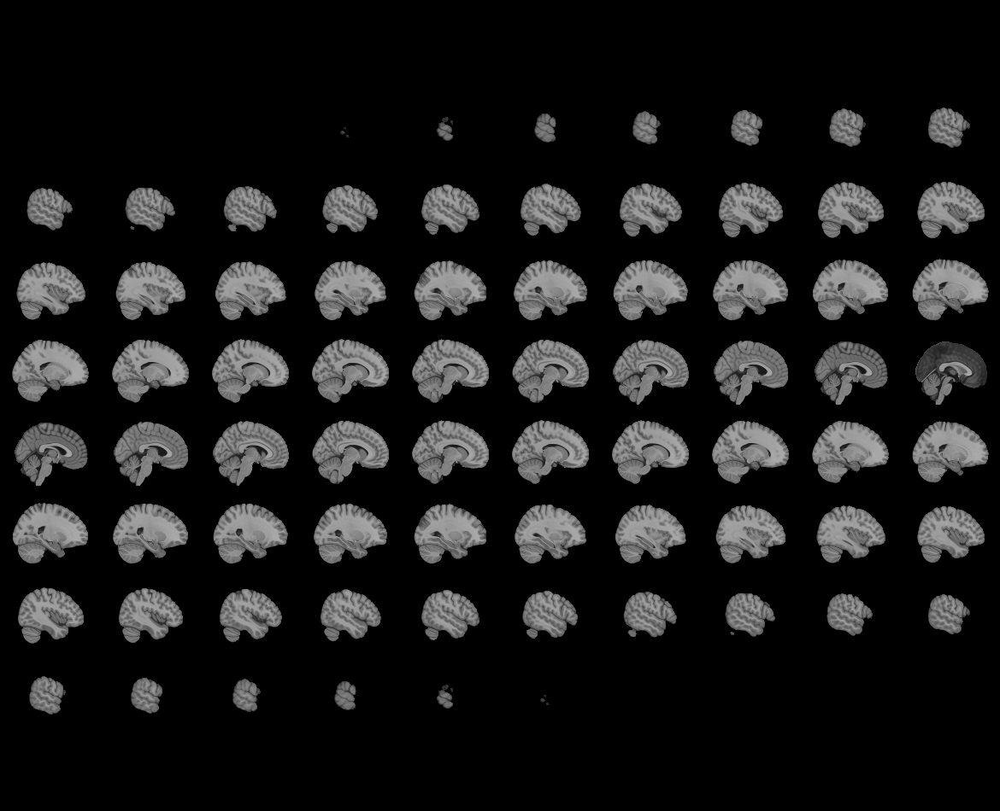
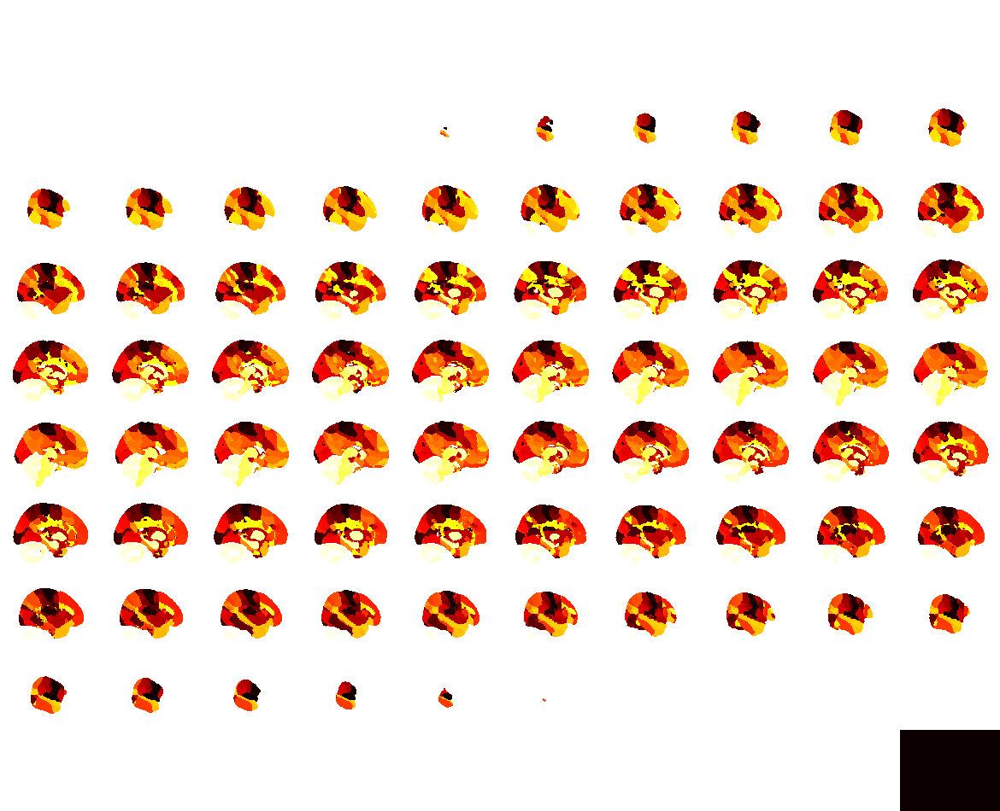

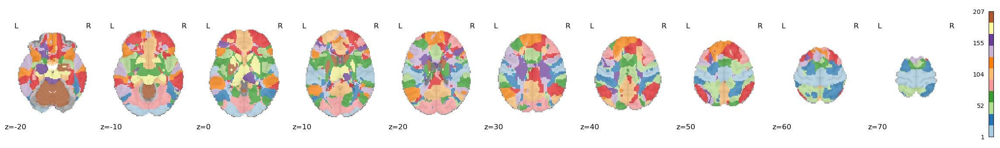

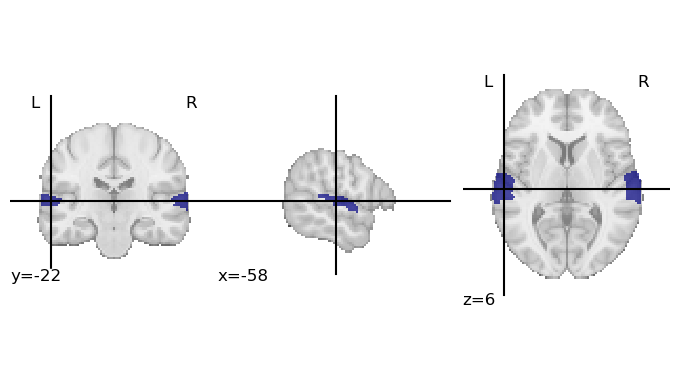

In [104]:
fine_ICP = "/project/3022057.01/resources/rois/ICPAtlas_v4_fine_208parcels.nii.gz"
course_ICP = "/project/3022057.01/resources/rois/ICPAtlas_v4_coarse_79parcels.nii.gz"
mask, atlas, region_labels = create_mask(fine_ICP)
print("Number of Labels in Mask: ", len(region_labels))
view_labels(atlas)
nplot.view_img(atlas)

### Parcellate Each Subject

In [14]:
alldata = parcellate_all(allsubs,mask,region_labels,save=True,verbose=True, location="icp_parcellated_subs")   

/project_cephfs/3022017.01/S1200/212015/MNINonLinear/Results/rfMRI_REST2_LR/rfMRI_REST2_LR.nii.gz
Number of atlas labels:  208
Number of parcellated labels:  208
Missing labels:  set()
/project/3022057.01/icp_parcellated_subs/104416/tfMRI_MOTOR_LR_parcellated.npy
/project_cephfs/3022017.01/S1200/153833/MNINonLinear/Results/rfMRI_REST2_LR/rfMRI_REST2_LR.nii.gz
Number of atlas labels:  208
Number of parcellated labels:  208
Missing labels:  set()
/project/3022057.01/icp_parcellated_subs/153833/rfMRI_REST2_LR_parcellated.npy
/project_cephfs/3022017.01/S1200/153833/MNINonLinear/Results/tfMRI_MOTOR_LR/tfMRI_MOTOR_LR.nii.gz
Number of atlas labels:  208
Number of parcellated labels:  208
Missing labels:  set()
/project/3022057.01/icp_parcellated_subs/153833/tfMRI_MOTOR_LR_parcellated.npy
/project_cephfs/3022017.01/S1200/199251/MNINonLinear/Results/rfMRI_REST2_LR/rfMRI_REST2_LR.nii.gz
Number of atlas labels:  208
Number of parcellated labels:  208
Missing labels:  set()
/project/3022057.01/icp

/opt/anaconda3/2023.03/lib/python3.10/site-packages/joblib/memory.py:349: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  return self.func(*args, **kwargs)


Number of atlas labels:  208
Number of parcellated labels:  208
Missing labels:  set()
/project/3022057.01/icp_parcellated_subs/212015/rfMRI_REST2_LR_parcellated.npy
/project_cephfs/3022017.01/S1200/212015/MNINonLinear/Results/tfMRI_MOTOR_LR/tfMRI_MOTOR_LR.nii.gz
Number of atlas labels:  208
Number of parcellated labels:  208
Missing labels:  set()
/project/3022057.01/icp_parcellated_subs/212015/tfMRI_MOTOR_LR_parcellated.npy
/project_cephfs/3022017.01/S1200/204622/MNINonLinear/Results/rfMRI_REST2_LR/rfMRI_REST2_LR.nii.gz
Number of atlas labels:  208
Number of parcellated labels:  208
Missing labels:  set()
/project/3022057.01/icp_parcellated_subs/204622/rfMRI_REST2_LR_parcellated.npy
/project_cephfs/3022017.01/S1200/204622/MNINonLinear/Results/tfMRI_MOTOR_LR/tfMRI_MOTOR_LR.nii.gz
Number of atlas labels:  208
Number of parcellated labels:  208
Missing labels:  set()
/project/3022057.01/icp_parcellated_subs/204622/tfMRI_MOTOR_LR_parcellated.npy
/project_cephfs/3022017.01/S1200/132118/MN

In [17]:
np.array(alldata).shape

/scratch/zaisou/51014843.dccn-l029.dccn.nl/ipykernel_61088/2957516162.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array(alldata).shape


(400,)

### Load Already Parcellated Subjects

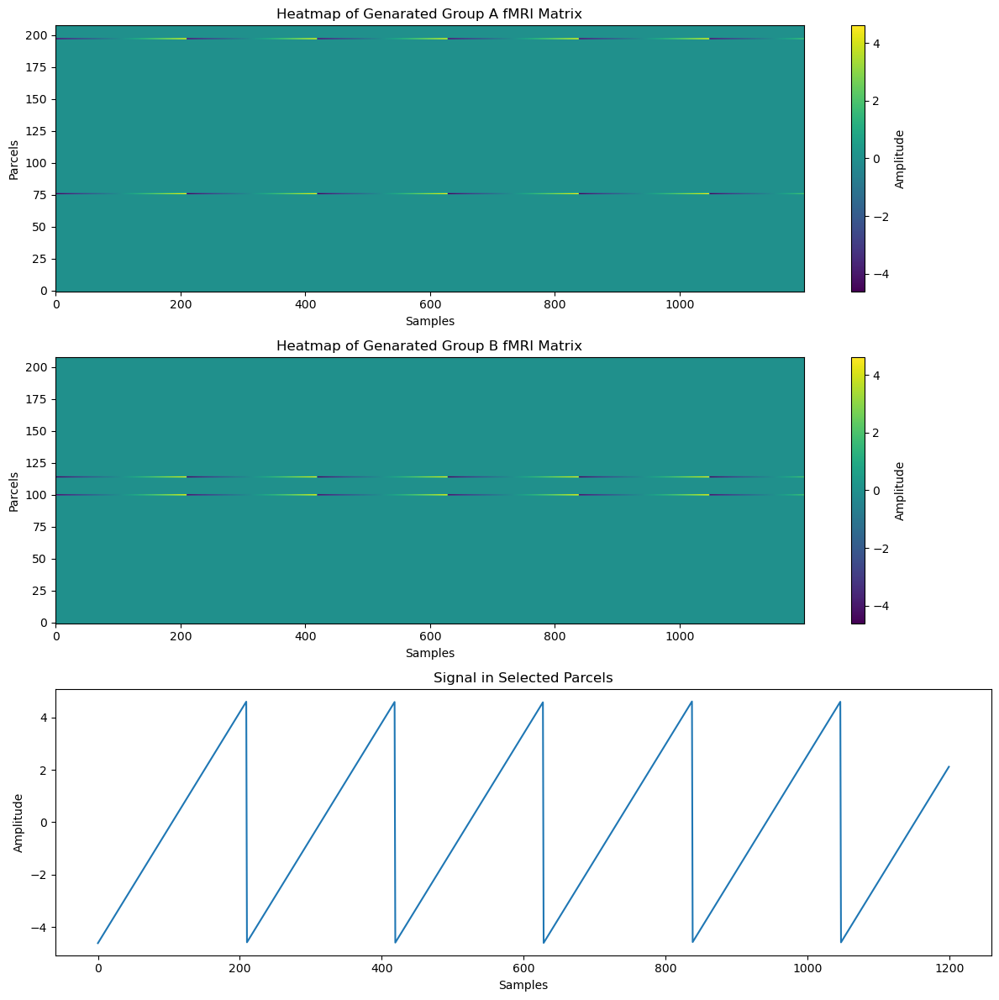

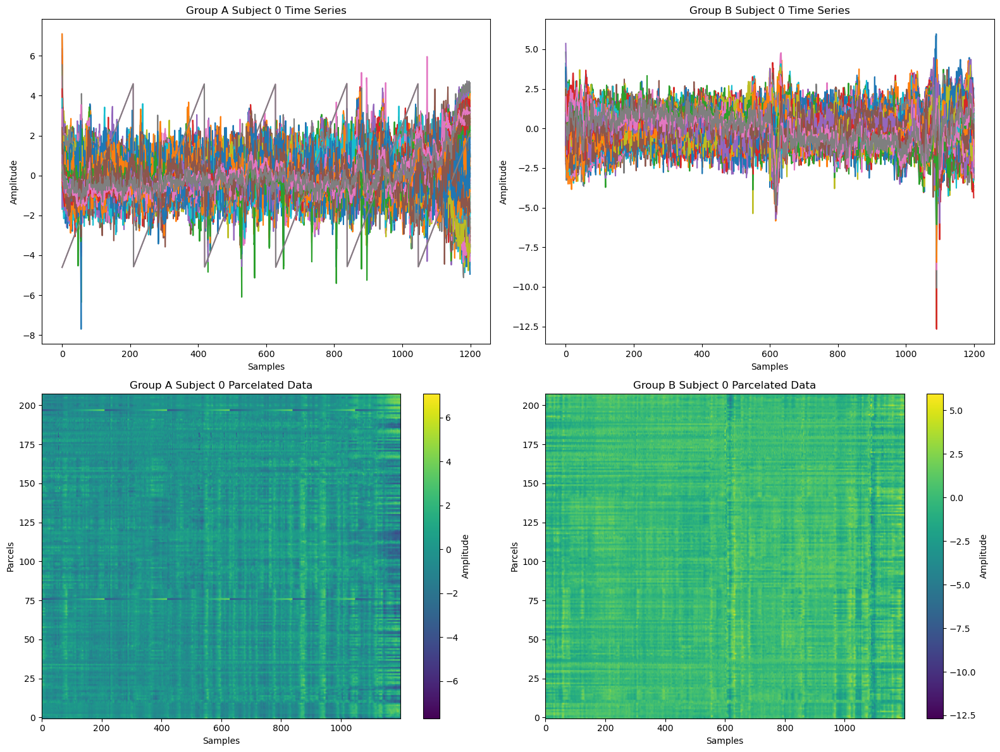

In [20]:
subjects_path = r'/project/3022057.01/icp_parcellated_subs'

groupA_data = []
groupB_data = []
groupA_type = "REST2"
groupB_type = "MOTOR"
simulate = True

if simulate:
    allsubs_data = []
    for subdir, dirs, files in os.walk(subjects_path):
        for file in files:
            if groupA_type in file:
                sub_data = np.load(os.path.join(subdir,file))
                if sub_data.shape[0] == 1200:
                    allsubs_data.append(sub_data)
    allsubs_data = np.array(allsubs_data)
    groupA_data, groupB_data = simulate_data(allsubs_data, sig_freq=.03, spatial_ratio=.01, temporal_ratio=.8, sub_ratio=.8, noise_level=0.00, shared_level=0.0, simulateA=True, simulateB=False)
else:
    for subdir, dirs, files in os.walk(subjects_path):
        for file in files:
            if groupA_type in file:
                sub_data = np.load(os.path.join(subdir,file))
                if sub_data.shape[0] == 1200:
                    groupA_data.append(sub_data)
            elif (groupB_type in file):
                groupB_data.append(np.load(os.path.join(subdir,file)))

groupA_data = np.array(groupA_data)
groupB_data = np.array(groupB_data)
# # all_subjects_data = np.array(all_subjects_data)
# last = groupA_data[0].shape
# for sub in groupA_data:
#     if last != sub.shape:
#         print(sub.shape)
#     else:
#         last = sub.shape
# last = groupB_data[0].shape
# for sub in groupB_data:
#     if last != sub.shape:
#         print(sub.shape)
#     else:
#         last = sub.shape
visualize_semi_simulated_subject(groupA_data, groupB_data)

### Standardize & Demean Each ROI Time Series for Each Subject and Demean Across Parcels for Each Timepoint

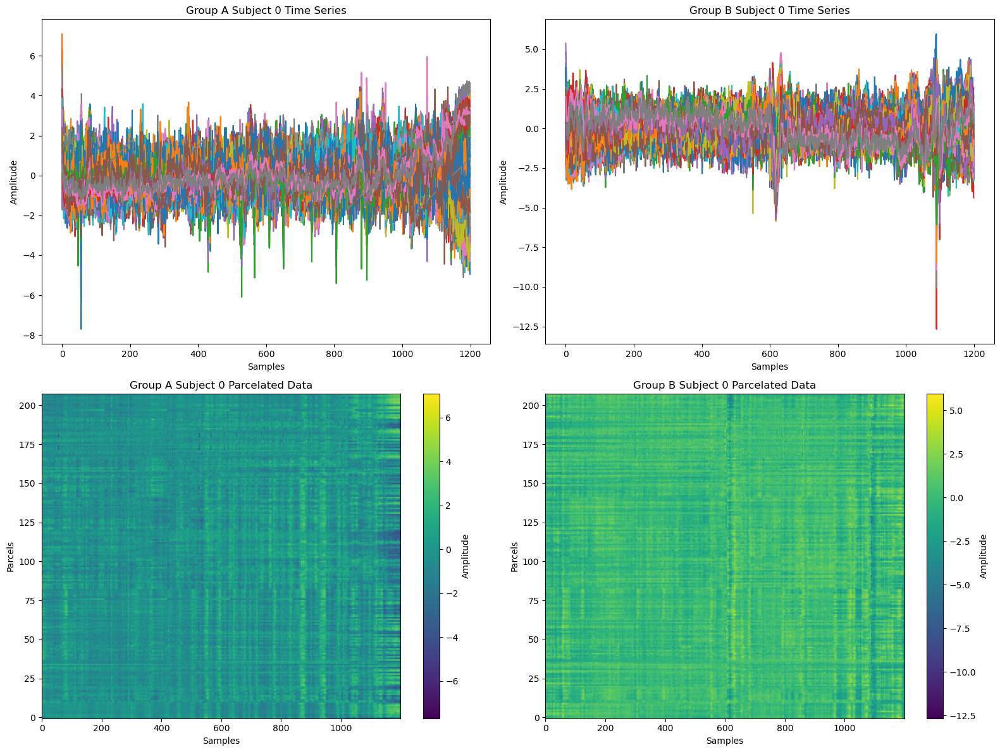

In [21]:
preprocessed_GroupA = standardize_demean(groupA_data)
preprocessed_GroupB = standardize_demean(groupB_data)
visualize_semi_simulated_subject(preprocessed_GroupA, preprocessed_GroupB)

### Create Covariance Matrices

In [23]:
groupA_covs = []
for subject in preprocessed_GroupA:
    groupA_covs.append(regcov(subject, gamma=0.0001, sc=1.0, beta=0.0, ddof=1.0))
groupA_covs = np.array(groupA_covs)

groupB_covs = []
for subject in preprocessed_GroupB:
    groupB_covs.append(regcov(subject, gamma=0.0001, sc=1.0, beta=0.0, ddof=1.0))
groupB_covs = np.array(groupB_covs)

### Average Covariance Matrices

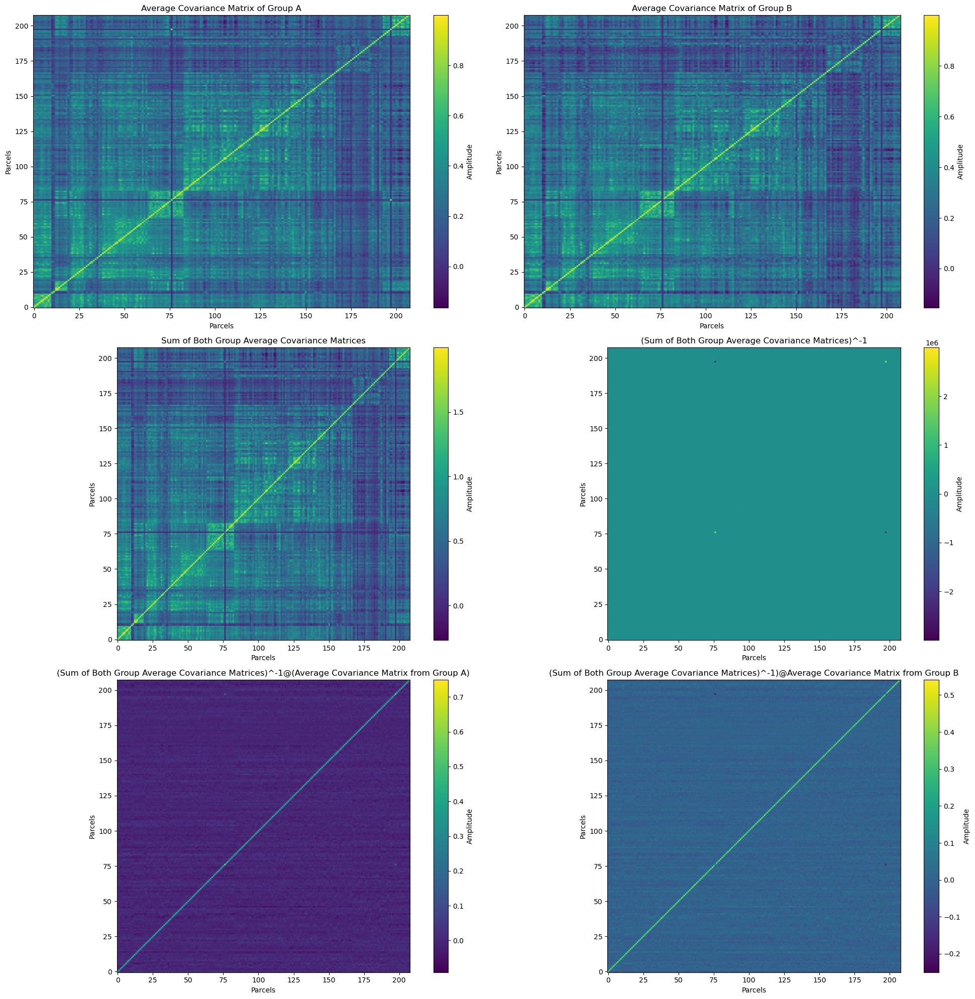

In [24]:
groupA_average_cov, groupB_average_cov = average_covs(groupA_covs, groupB_covs, visualize=True)

### Test Pipeline on Single Subject

In [84]:
sub_image1 = '/project_cephfs/3022017.01/S1200/143426/MNINonLinear/Results/rfMRI_REST2_LR/rfMRI_REST2_LR.nii.gz'
sub_image2 = '/project_cephfs/3022017.01/S1200/143426/MNINonLinear/Results/tfMRI_MOTOR_LR/tfMRI_MOTOR_LR.nii.gz'
onesub_fMRI = parcellate(nimg.load_img(sub_image1),mask,region_labels)
onesub_task = parcellate(nimg.load_img(sub_image2),mask,region_labels)

/opt/anaconda3/2023.03/lib/python3.10/site-packages/joblib/memory.py:349: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  return self.func(*args, **kwargs)


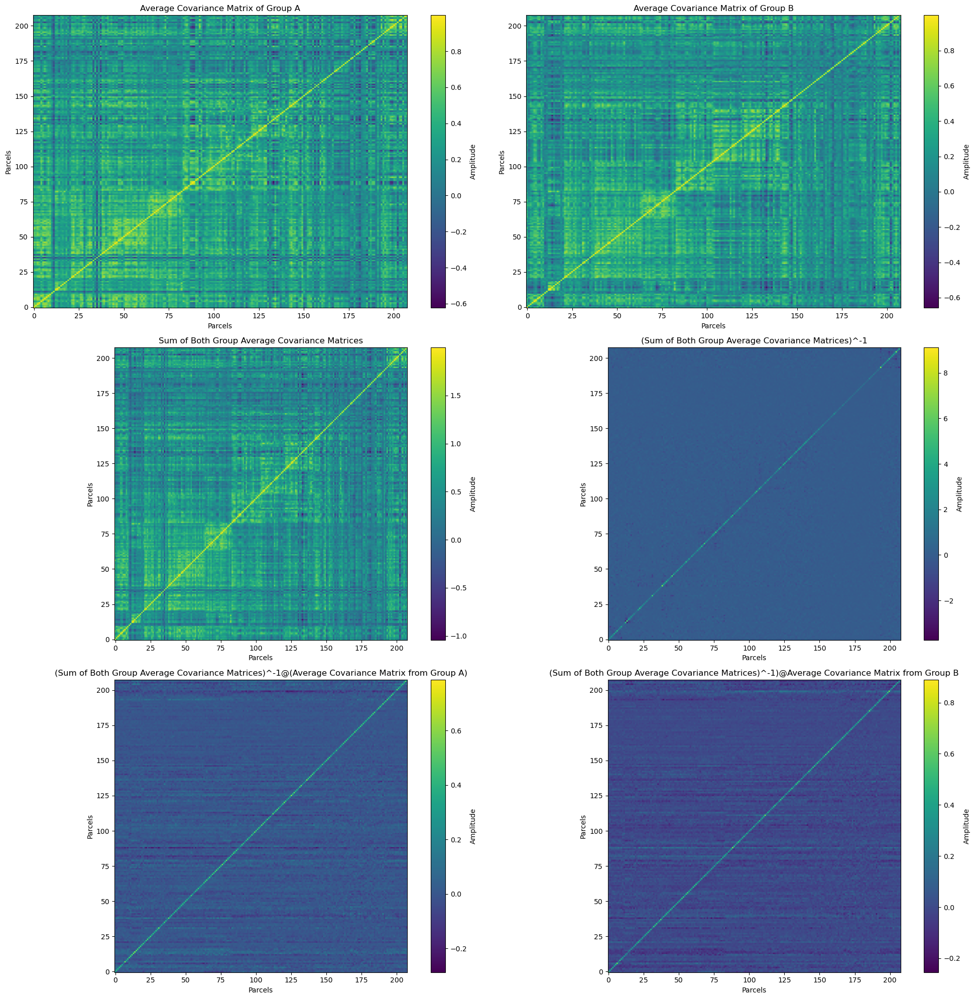

In [142]:
onesub_fMRI_3d = onesub_fMRI[np.newaxis,:,:]
onesub_task_3d = onesub_task[np.newaxis,:,:]

pp_onesub_fMRI = standardize_demean(onesub_fMRI_3d)
pp_onsesub_task = standardize_demean(onesub_task_3d)
onesub_covA = []
for subject in pp_onesub_fMRI:
    onesub_covA.append(regcov(subject, gamma=0.00001, sc=1.0, beta=0.0, ddof=1.0))
onesub_covA = np.array(onesub_covA)

onesub_covB = []
for subject in pp_onsesub_task:
    onesub_covB.append(regcov(subject, gamma=0.00001, sc=1.0, beta=0.0, ddof=1.0))
onesub_covB = np.array(onesub_covB)

_,_ = average_covs(onesub_covA,onesub_covB)

### FKT

In [25]:
reshaped_preprocessed_subjects = np.array(np.vstack((preprocessed_GroupA.reshape(-1, preprocessed_GroupA.shape[2]), preprocessed_GroupB.reshape(-1, preprocessed_GroupB.shape[2]))))

#### PCA FKT Comparison

In [178]:
thresholds = np.linspace(0.5,.8,num=50)
fkt_variance_all = []
group_variance_all = []
n_filters = []
for t in thresholds:
    fkt_eigs_loop, fkt_filters_loop = FKT(groupA_average_cov, groupB_average_cov, auto_select=True, threshold= t)
    if fkt_eigs_loop.shape[0] > 0:
        fkt_variance_loop, group_variance_loop = f_test(fkt_filters_loop,reshaped_preprocessed_subjects,verbose=False)
        group_variance_all.append(group_variance_loop)
        fkt_variance_all.append(fkt_variance_loop)
        n_filters.append(fkt_eigs_loop.shape[0])


KeyboardInterrupt: 

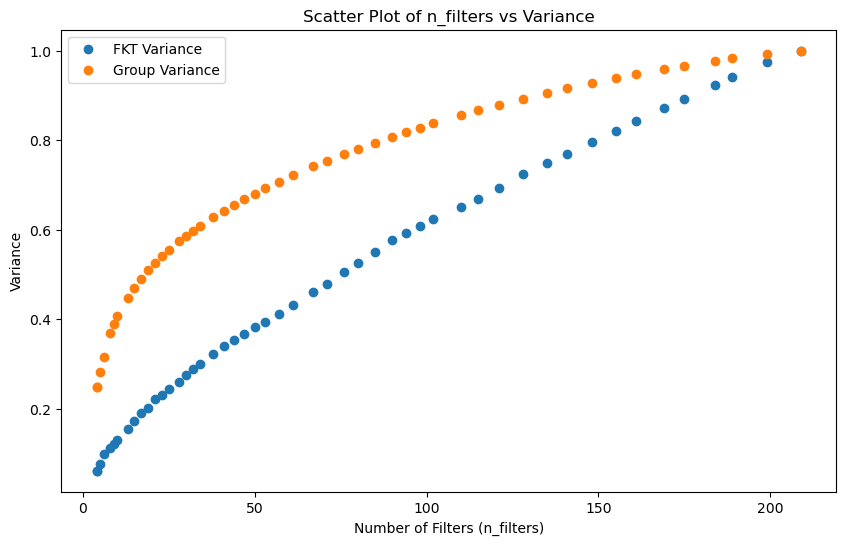

In [112]:
# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(n_filters, fkt_variance_all, label='FKT Variance')
plt.scatter(n_filters, group_variance_all, label='Group Variance')

# Add labels and title
plt.xlabel('Number of Filters (n_filters)')
plt.ylabel('Variance')
plt.title('Scatter Plot of n_filters vs Variance')
plt.legend()

# Show the plot
plt.show()

#### Numerical Stability

In [47]:
groupA_eigs1, groupA_filters1, groupB_eigs1, groupB_filters1, groupA_eigs2, groupA_filters2, groupB_eigs2, groupB_filters2, groupA_eigs3, groupA_filters3, groupB_eigs3, groupB_filters3 = numerical_stability(groupA_average_cov, groupB_average_cov)

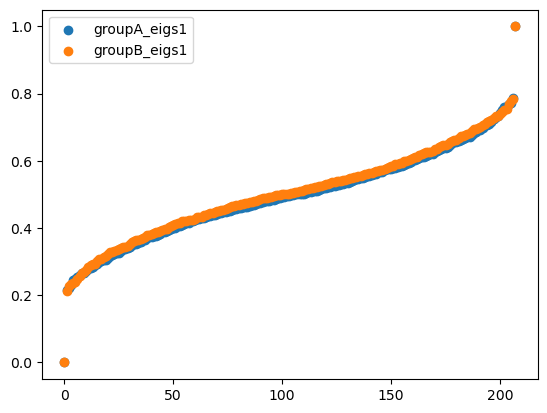

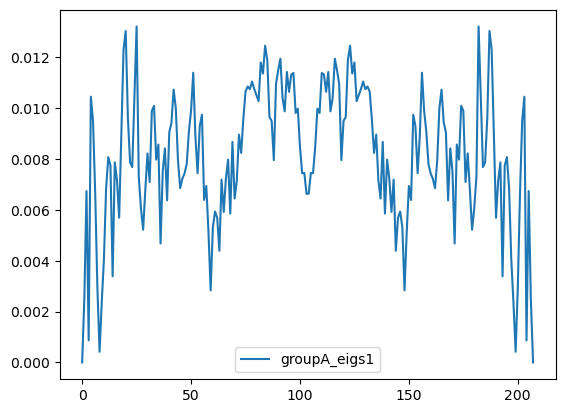

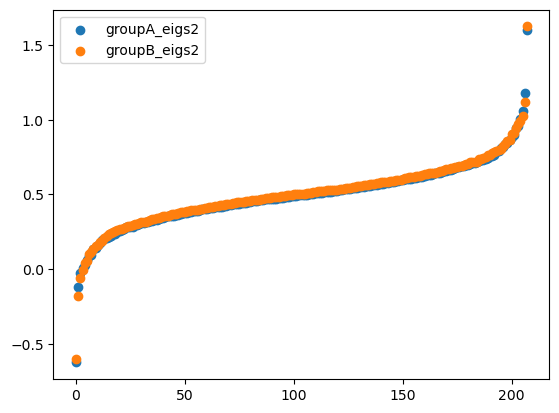

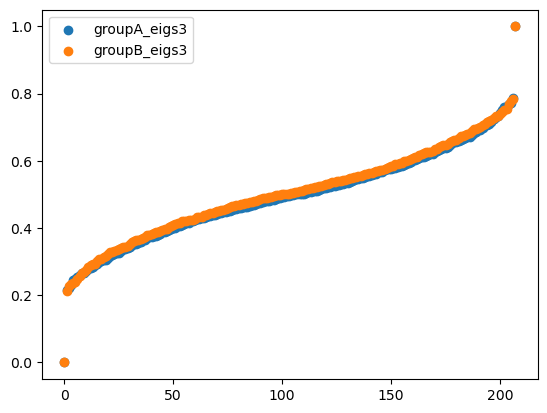

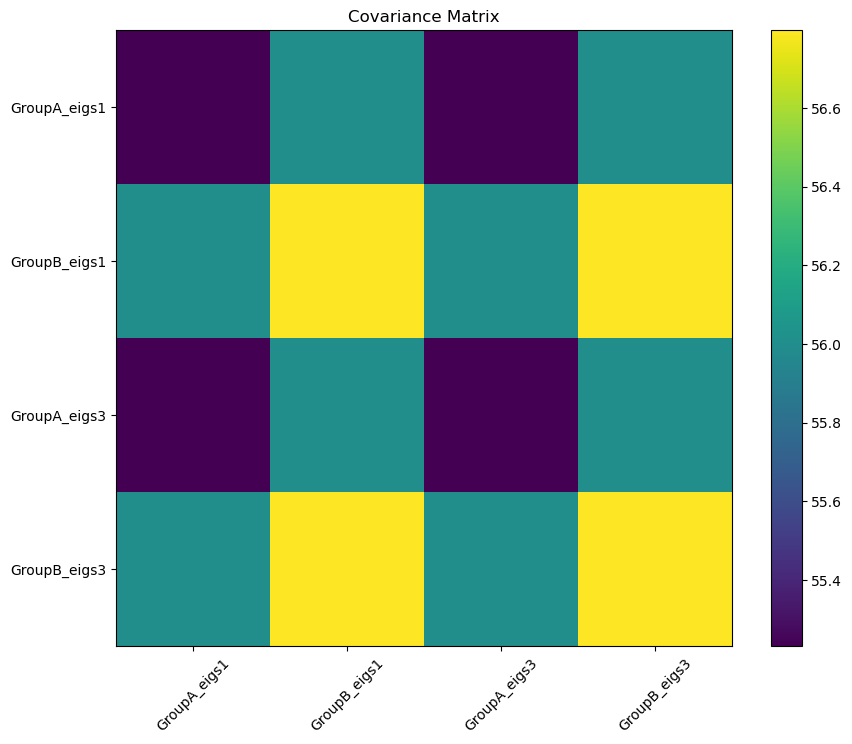

55.232118819963446

In [48]:
plt.figure()
plt.scatter(range(0,groupA_eigs1.shape[0]), groupA_eigs1,label='groupA_eigs1')
plt.scatter(range(0,groupB_eigs1.shape[0]), groupB_eigs1,label='groupB_eigs1')
plt.legend()
plt.show()

plt.figure()
plt.plot(np.abs(groupA_eigs1-groupB_eigs1),label='groupA_eigs1')
plt.legend()
plt.show()

plt.figure()
plt.scatter(range(0,groupA_eigs2.shape[0]), groupA_eigs2,label='groupA_eigs2')
plt.scatter(range(0,groupB_eigs2.shape[0]), groupB_eigs2,label='groupB_eigs2')
plt.legend()
plt.show()

plt.figure()
plt.scatter(range(0,groupA_eigs3.shape[0]), groupA_eigs3,label='groupA_eigs3')
plt.scatter(range(0,groupB_eigs3.shape[0]), groupB_eigs3,label='groupB_eigs3')
plt.legend()
plt.show()


groups = np.array([groupA_eigs1, groupB_eigs1,
                   groupA_eigs3, groupB_eigs3])
# Calculate the covariance matrix
covariance_matrix = np.cov(groups)

# Define labels for the axes
labels = ['GroupA_eigs1', 'GroupB_eigs1', 'GroupA_eigs3', 'GroupB_eigs3']

plt.figure(figsize=(10, 8))
plt.imshow(groups@groups.T, cmap='viridis', interpolation='nearest')
plt.colorbar()
plt.title('Covariance Matrix')
plt.xticks(ticks=np.arange(len(labels)), labels=labels, rotation=45)
plt.yticks(ticks=np.arange(len(labels)), labels=labels)
plt.show()
groupA_eigs1.T@groupA_eigs1

#### FKT Analysis Application for ICA

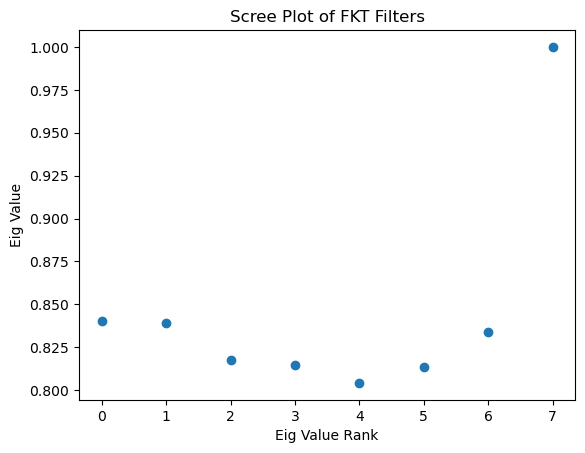

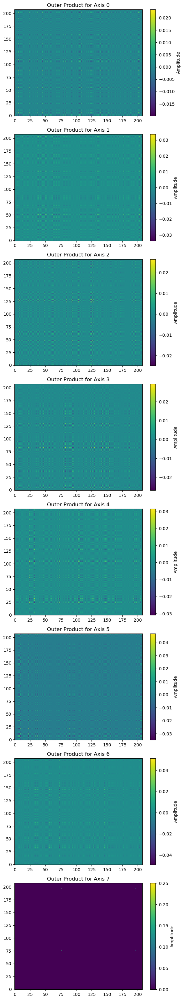

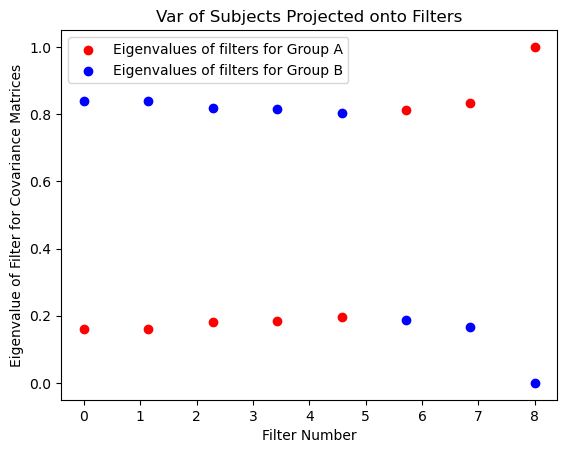

Total Variance:  175644.4768031205
Variance of Group Projected on 8 FKT Filters: 19444.348331777506
Variance of Group projected on Top 8 PCA vectors: 60604.33548805625
F Ratio of FKT Variance/Total Variance: 0.11070287370079182
F Ratio of PCA Variance/Total Variance: 0.34503980194029965
F Ratio of FKT Variance/PCA Variance: 0.32084088003257705


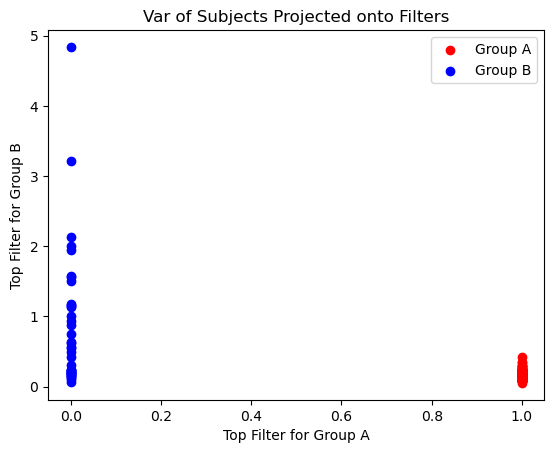

In [30]:
fkt_eigs, fkt_filters = FKT(groupA_average_cov, groupB_average_cov, auto_select=True, threshold= 0.8, visualize=True)
fkt_variance, group_variance = f_test(fkt_filters,reshaped_preprocessed_subjects,preprocessed_GroupA,preprocessed_GroupB)

In [50]:
n_eigs, fkt_sum = PCA_discrim(reshaped_preprocessed_subjects, preprocessed_GroupA, preprocessed_GroupB, groupA_average_cov, groupB_average_cov, fkt_eigs.shape[0])

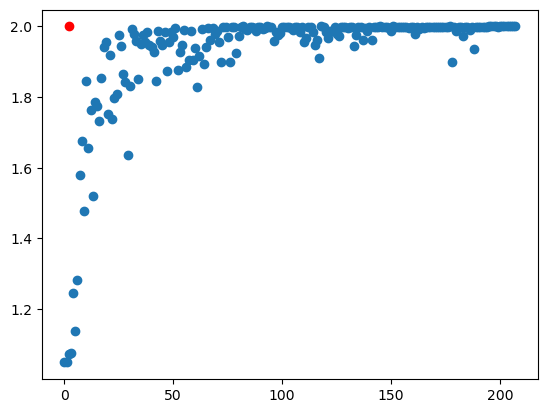

0.9999999582944155 [1.0489820837974548, 1.0511067509651184, 1.0740973353385925, 1.0752453207969666, 1.2460257709026337, 1.1394806206226349, 1.282981961965561, 1.5808800160884857, 1.6768594682216644, 1.4763955175876617, 1.8464204370975494, 1.6561469435691833, 1.7640242874622345, 1.5198167860507965, 1.7851186096668243, 1.7759197056293488, 1.7318818271160126, 1.853957325220108, 1.9413028061389923, 1.9566071927547455, 1.7520971894264221, 1.918478101491928, 1.73899307847023, 1.7963456809520721, 1.8082111179828644, 1.9753188788890839, 1.945142537355423, 1.865549236536026, 1.8426280915737152, 1.6366269290447235, 1.830681174993515, 1.9930415898561478, 1.978087842464447, 1.9586851447820663, 1.851356640458107, 1.9497254192829132, 1.9762543588876724, 1.954683855175972, 1.98431895673275, 1.9484418779611588, 1.9414332062005997, 1.927218720316887, 1.845352366566658, 1.9869395643472672, 1.9598989635705948, 1.9466392546892166, 1.9856372624635696, 1.8738139122724533, 1.9573733061552048, 1.9830548614263

In [58]:
plt.figure()
plt.scatter(n_eigs,fkt_sum)
plt.scatter(fkt_eigs.shape[0],np.sum(fkt_eigs),color='red')
plt.show()
ncomp = np.where(fkt_sum >= np.sum(fkt_eigs)-.05)[0][0]
print(np.max(fkt_eigs), fkt_sum)
print(ncomp)

In [87]:
# n = fkt_eigs.shape[0]
# cut_off = 0

# demean_preprocessed = reshaped_preprocessed__subjects - np.mean(reshaped_preprocessed__subjects,axis=1,keepdims=True)
# group_U, group_sigma, group_Vh = np.linalg.svd(demean_preprocessed,full_matrices=False)
# total_variance = np.sum(np.square(group_sigma)/(group_sigma.shape[0]-1))
# ncomp = 0
# for i in range(group_sigma.shape[0]-n):
#     variance = np.sum(np.square(group_sigma[i:(i+n)])/(group_sigma.shape[0]-1))/total_variance
#     if variance < fkt_variance:
#         ncomp = (i+n)
#         break
# print(ncomp)

22


### ICA

#### Single Subject IFA

In [31]:
groupA_subject = preprocessed_GroupA[np.random.choice(range(preprocessed_GroupA.shape[0])),:,:]
groupB_subject = preprocessed_GroupB[np.random.choice(range(preprocessed_GroupB.shape[0])),:,:]

groupA_subject_projected, groupA_subject_fkt_U = FKT_proj(groupA_subject,fkt_filters)
groupB_sub_subject_projected, groupA_subject_fkt_U = FKT_proj(groupA_subject,fkt_filters)
groupBject_projected, groupB_subject_fkt_U = FKT_proj(groupB_subject,fkt_filters)

n = groupA_subject_projected.shape[0]
ica = FastICA(n_components=n)
fkt_ica_components = ica.fit_transform(groupA_subject_projected.T)
fkt_mixing = ica.mixing_


/opt/anaconda3/2023.03/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


In [ ]:
np.linalg.pinv((groupA_subject@fkt_filter).T)@(groupA_subject@fkt_filter).T

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 1200 is different from 8)

In [42]:
(np.linalg.pinv(groupA_subject@fkt_filters)@fkt_mixing@fkt_ica_components.T).shape

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 8 is different from 1200)

In [43]:
np.isclose(np.linalg.pinv(groupA_subject@fkt_filters)@fkt_mixing@fkt_ica_components.T,groupA_subject)

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 8 is different from 1200)

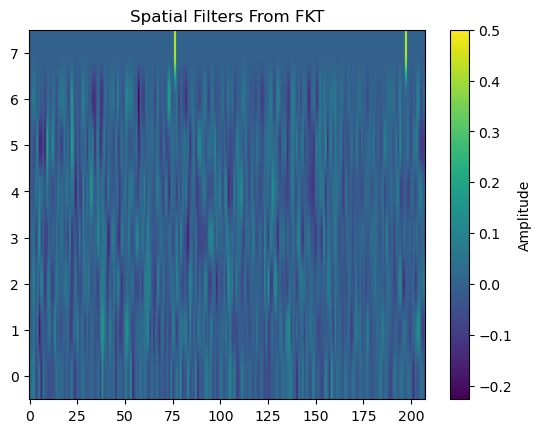

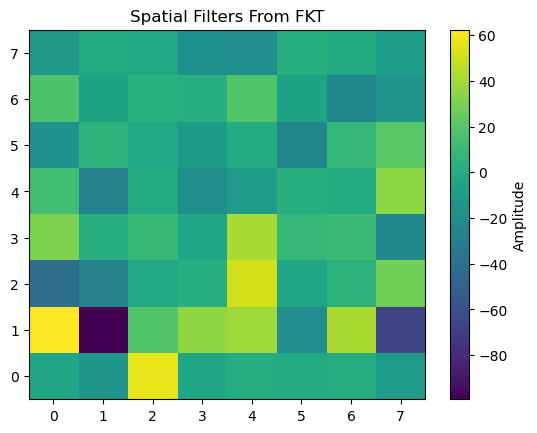

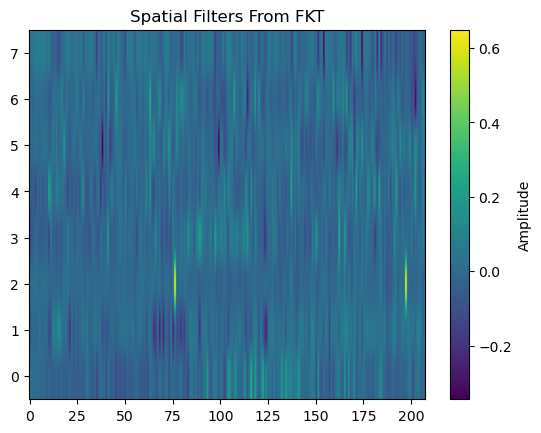

In [33]:
plt.figure()
plt.imshow(fkt_filters.T,aspect='auto', cmap='viridis', origin='lower')
plt.colorbar(label='Amplitude')
plt.title("Spatial Filters From FKT")
plt.show()

plt.figure()
plt.imshow(fkt_mixing,aspect='auto', cmap='viridis', origin='lower')
plt.colorbar(label='Amplitude')
plt.title("Spatial Filters From FKT")
plt.show()

plt.figure()
plt.imshow(fkt_ica_components.T,aspect='auto', cmap='viridis', origin='lower')
plt.colorbar(label='Amplitude')
plt.title("Spatial Filters From FKT")
plt.show()


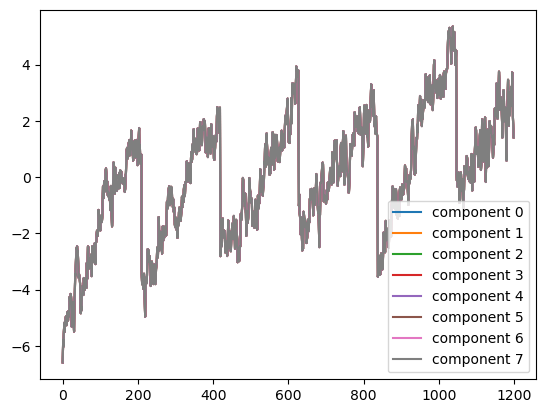

In [39]:
plt.figure()
for i in range(fkt_ica_components.shape[1]):
    # comp = (groupA_subject_fkt_U@fkt_mixing)[:,2]
    comp = (groupA_subject@fkt_ica_components[:,2])
    # std_fkt_ica = (comp-np.mean(comp,keepdims=True,axis=0))/np.std(comp,axis=0)
    # masked_comp = comp*(np.abs(std_fkt_ica)>3.0)
    # print(np.where(np.abs(std_fkt_ica)>3.0))
    plt.plot(comp,label=f"component {i}")
plt.legend()
plt.show()

#### Group IFA

#### Comparison to Group ICA

In [179]:
projected, fkt_U = FKT_proj(reshaped_preprocessed_subjects,fkt_filters)

In [112]:
n = projected.shape[0]
ica = FastICA(n_components=15)

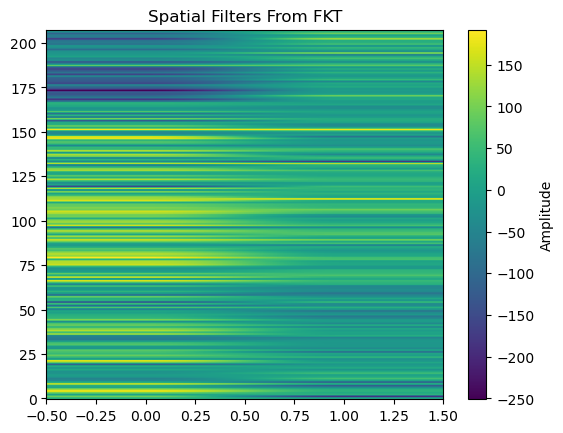

/opt/anaconda3/2023.03/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/opt/anaconda3/2023.03/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:589: UserWarning: n_components is too large: it will be set to 2
  warnings.warn(


(208, 2)


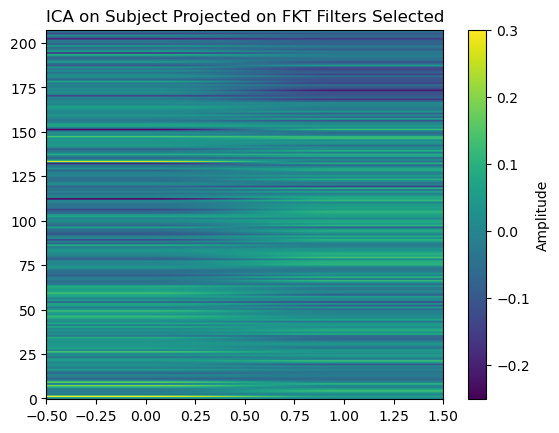

/opt/anaconda3/2023.03/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


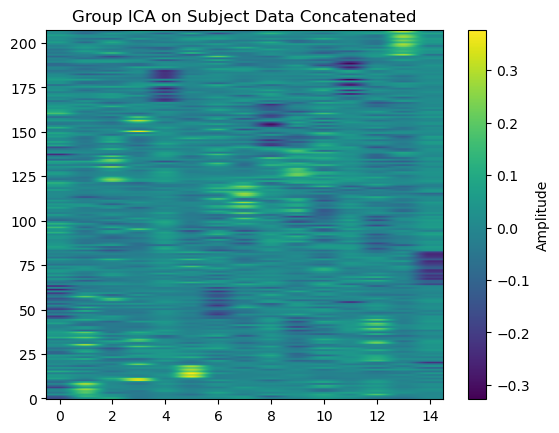

In [113]:
plt.figure()
plt.imshow(projected.T,aspect='auto', cmap='viridis', origin='lower')
plt.colorbar(label='Amplitude')
plt.title("Spatial Filters From FKT")
plt.show()

fkt_ica_components = ica.fit_transform(projected.T)
fkt_mixing = ica.mixing_
print(fkt_ica_components.shape)
plt.figure()
plt.imshow(fkt_ica_components,aspect='auto', cmap='viridis', origin='lower')
plt.colorbar(label='Amplitude')
plt.title("ICA on Subject Projected on FKT Filters Selected")
plt.show()


group_ica_components = ica.fit_transform(reshaped_preprocessed_subjects.T)
group_mixing = ica.mixing_
plt.figure()
plt.imshow(group_ica_components,aspect='auto', cmap='viridis', origin='lower')
plt.colorbar(label='Amplitude')
plt.title("Group ICA on Subject Data Concatenated")
plt.show()

/opt/anaconda3/2023.03/lib/python3.10/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/home/mrstats/zaisou/.local/lib/python3.10/site-packages/nilearn/image/resampling.py:291: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn(
/home/mrstats/zaisou/.local/lib/python3.10/site-packages/nilearn/plotting/html_document.py:65: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn(



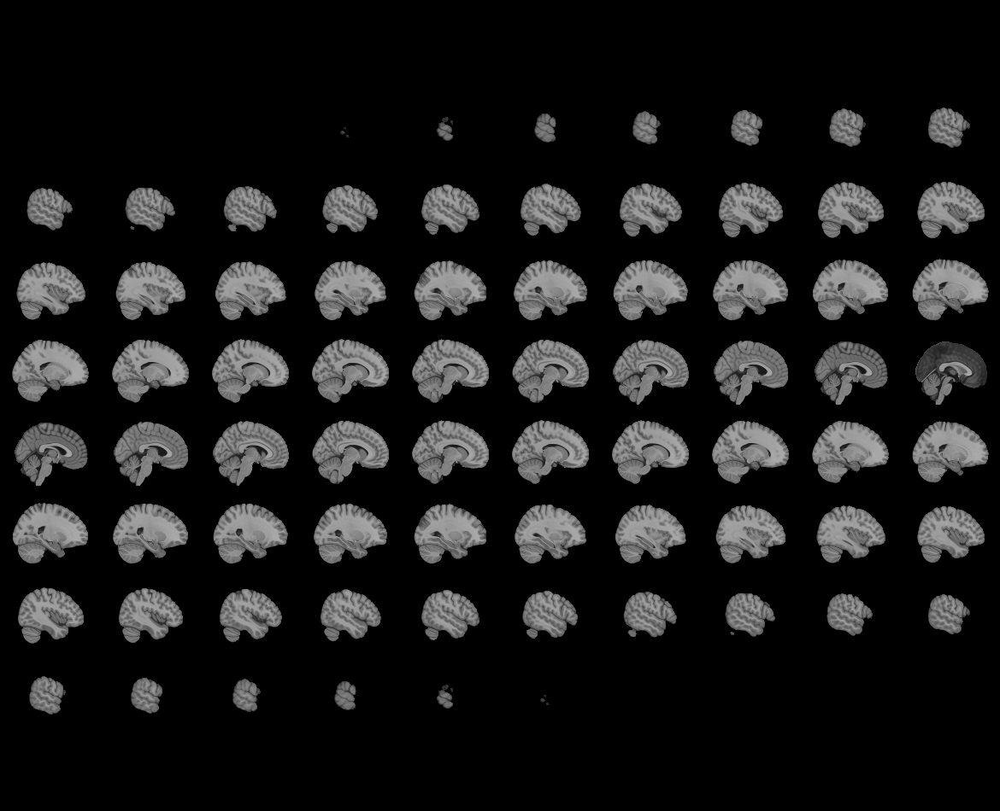
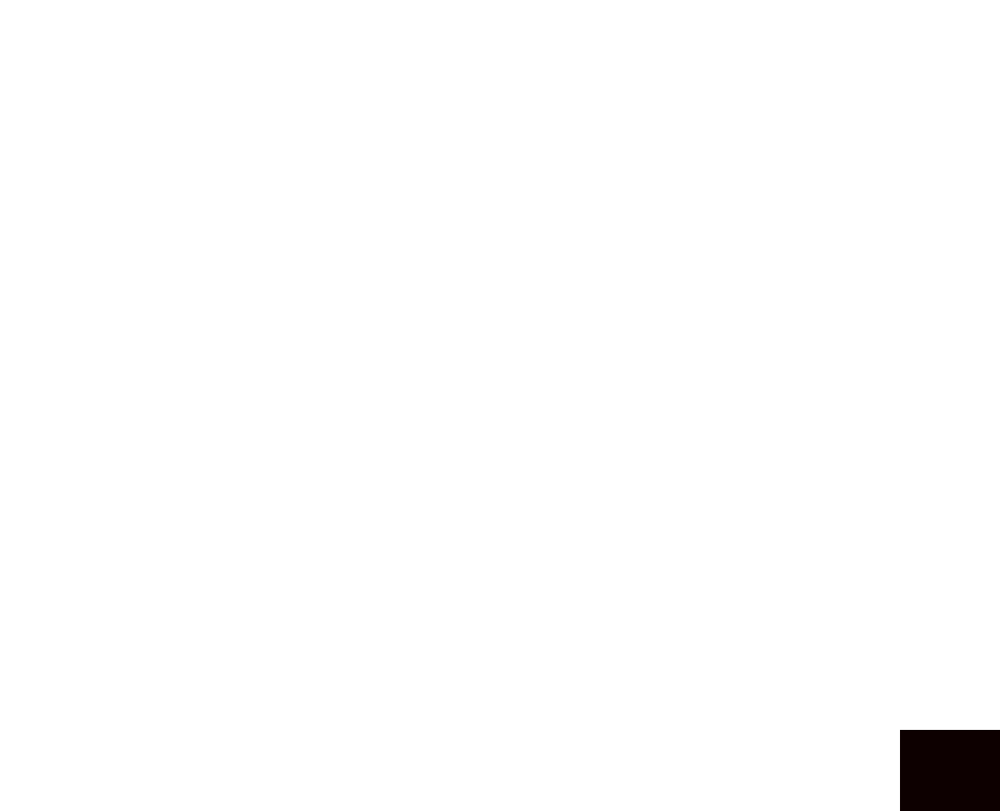

In [157]:
nplot.view_img(nimg.math_img('((a == 2)| (a == 113) | (a == 134) | (a == 152))', a=atlas) )

/opt/anaconda3/2023.03/lib/python3.10/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/home/mrstats/zaisou/.local/lib/python3.10/site-packages/nilearn/image/resampling.py:291: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn(
/home/mrstats/zaisou/.local/lib/python3.10/site-packages/nilearn/plotting/html_document.py:65: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn(



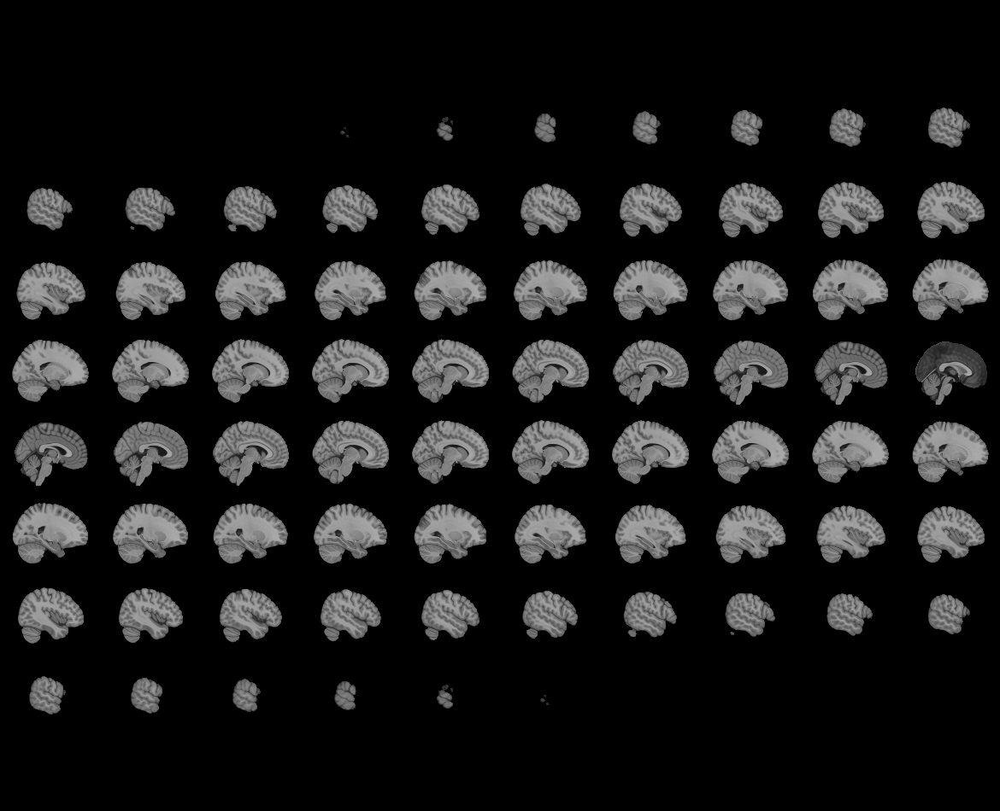
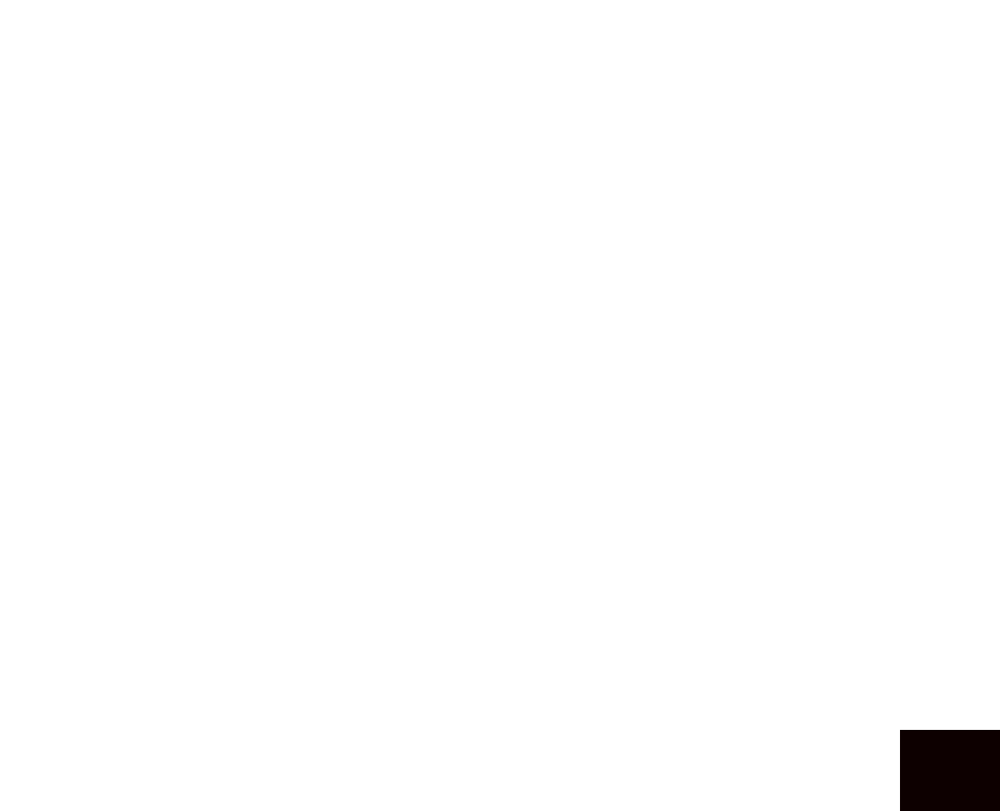

In [159]:
nplot.view_img(nimg.math_img('(a == 174) ', a=atlas) )
# Load the atlas image
# atlas_img = nimg.load_img(atlas)

# # Create a new array by copying the data from the atlas image
# atlas_data = atlas_img.get_fdata().copy()

# # Modify the copied array
# new_atlas_data = atlas_data.copy()
# new_atlas_data[((new_atlas_data == 1) | (new_atlas_data == 2) | (new_atlas_data == 3) | (new_atlas_data == 4))] = 100000  # Replace voxels with value 174 with 0

# # Create a new image with the modified data
# new_atlas_img = nimg.new_img_like(atlas_img, new_atlas_data, atlas_img.affine)

# # View the new image
# nplot.view_img(new_atlas_img)


In [151]:
(fkt_U@fkt_mixing).shape

(294400, 2)

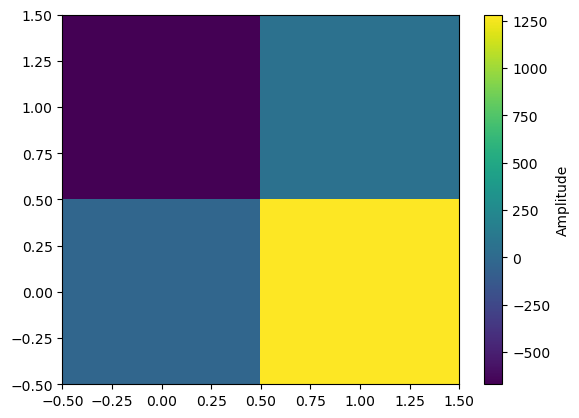

(array([  1, 112, 133, 151]),)
(array([173]),)


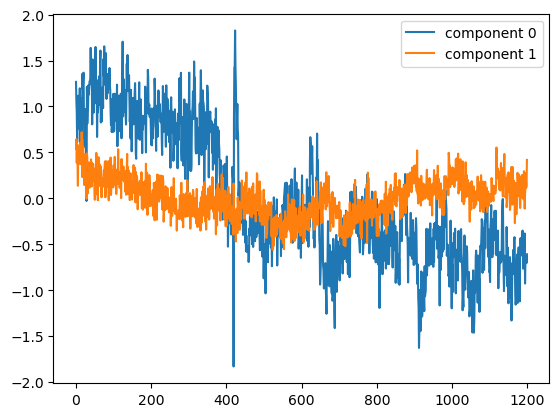

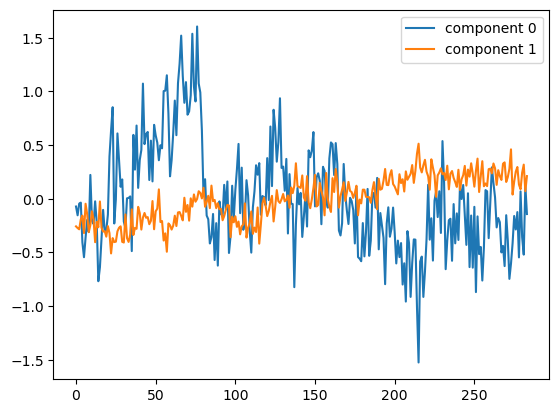

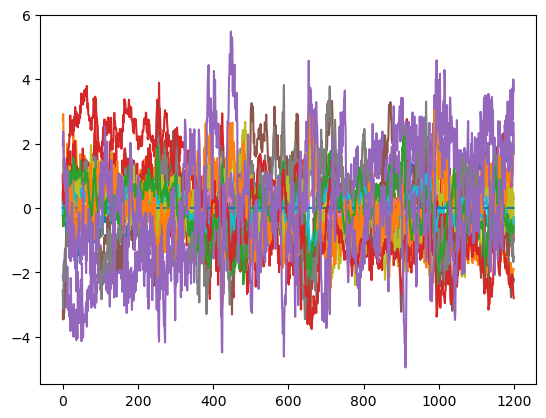

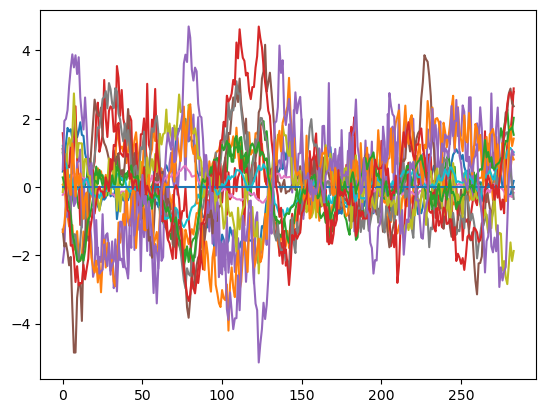

In [158]:
plt.figure()
plt.imshow(fkt_mixing,aspect='auto', cmap='viridis', origin='lower')
plt.colorbar(label='Amplitude')
plt.show()


plt.figure()
for i in range(fkt_ica_components.shape[1]):
    comp = fkt_ica_components[:,i]
    std_fkt_ica = (comp-np.mean(comp,keepdims=True,axis=0))/np.std(comp,axis=0)
    masked_comp = comp*(np.abs(std_fkt_ica)>3.0)
    print(np.where(np.abs(std_fkt_ica)>3.0))
    plt.plot(preprocessed_GroupA[0,:,:]@masked_comp,label=f"component {i}")
plt.legend()
plt.show()

plt.figure()
for i in range(fkt_ica_components.shape[1]):
    comp = fkt_ica_components[:,i]
    std_fkt_ica = (comp-np.mean(comp,keepdims=True,axis=0))/np.std(comp,axis=0)
    masked_comp = comp*(np.abs(std_fkt_ica)>3.0)
    plt.plot(preprocessed_GroupB[0,:,:]@masked_comp,label=f"component {i}")
plt.legend()
plt.show()

plt.figure()
for i in range(group_ica_components.shape[1]):
    comp = group_ica_components[:,i]
    std_fkt_ica = (comp-np.mean(comp,keepdims=True,axis=0))/np.std(comp,axis=0)
    masked_comp = comp*(np.abs(std_fkt_ica)>3.0)
    plt.plot(preprocessed_GroupA[0,:,:]@masked_comp)
plt.show()

plt.figure()
for i in range(group_ica_components.shape[1]):
    comp = group_ica_components[:,i]
    std_fkt_ica = (comp-np.mean(comp,keepdims=True,axis=0))/np.std(comp,axis=0)
    masked_comp = comp*(np.abs(std_fkt_ica)>3.0)
    plt.plot(preprocessed_GroupB[0,:,:]@masked_comp)
plt.show()

In [91]:
import nibabel as nib
import subprocess
import numpy as np

    time_courses = np.array(semi_sim_set[selected_subs[0],:,:])@filters
    index = np.argsort(np.reshape(sim_signal,(-1,1)).T@time_courses)[0][-1]
    signal_time_course = time_courses[:, index]
    filter_rank = len(eigs) - index
    spatial_filter = np.reshape(signal_time_course,(-1,1)).T@(semi_sim_set[selected_subs[0],:,:])
    spatial_indices = np.argsort(spatial_filter)

fkt_time_courses = np.array(preprocessed_semi_simulated_subjects[selected_subjects[0],:,:])@fkt_filters[:,-n:]
fkt_spatial_filter = fkt_time_courses.T@(preprocessed_semi_simulated_subjects[selected_subjects[0],:,:])

# Assuming 'preprocessed_semi_simulated_subjects' and 'selected_subjects' are defined
# Assuming 'fkt_filters', 'n', and 'output_dir' are defined

# Extract the subject data for the selected subject
subject_data = preprocessed_semi_simulated_subjects[selected_subjects[0], :, :]

# Calculate the temporal filter
fkt_time_courses = np.dot(subject_data, fkt_filters[:, -n:])

# Save temporal filter as NIfTI file
nib.save(nib.Nifti1Image(fkt_time_courses, np.eye(4)), 'fkt_temporal_filter.nii.gz')

# Run MELODIC for probabilistic ICAs
melodic_cmd = [
    'melodic',
    '-i', 'fkt_temporal_filter.nii.gz',
    '--outdir=' + '/project/3022057.01/IFA',
    '--Oall',
    '--report'
]

subprocess.run(melodic_cmd, check=True)

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 2 is different from 1200)

### Unsupervised IFA

In [ ]:
FKT(covs[selected_subjects[0],:,:], covs[selected_subjects[1],:,:], auto_select=True, threshold=.9)

In [59]:
n_matrices = len(covs)
all = np.zeros((n_matrices, n_matrices))
nfilters = 10
for i in range(n_matrices):
    print(i)
    for j in range(i, n_matrices):
        Cs = covs[j]
        oh = covs[i]

        # eigs = eigh(oh, oh + Cs, eigvals_only=True)
        # # all[i, j] = np.sum(abs(eigs[0] - 0.5) + abs(eigs[-1] - 0.5))
        # sum = 0
        # for m in range(nfilters):
        #     sum += abs(eigs[m] - 0.5) + abs(eigs[-(m+1)] - 0.5)
        eigs, _ = FKT(Cs, oh, auto_select=True, threshold=.9)
        all[i, j] = sum(abs(eigs-0.5))
        all[j, i] = all[i, j]

sns.heatmap(all, cmap='RdBu_r')

0


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23


KeyboardInterrupt: 

In [52]:
print(unselected_subjects)
print(np.argsort(all[0,:])[0:50])
len(np.setdiff1d(unselected_subjects,np.argsort(all[0,:])[0:50]))

[ 4  5  6  7  8  9 10 11 14 17 19 20 21 28 29 30 31 32 34 39 43 47 49 50
 51 53 55 60 62 64 66 70 71 75 76 77 78 79 80 82 83 88 89 90 91 93 94 96
 98 99]
[ 0 26 35 57 74 23 41 15 58 18 89 81 59  4 77 69 95 19 45 62  1  7 85 28
 87 46 68 27 92  8 67 98 38 50  5 78 94 73 60 31  9 49 22 79 53 97 75 36
 37 17]


29

/opt/anaconda3/2023.03/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


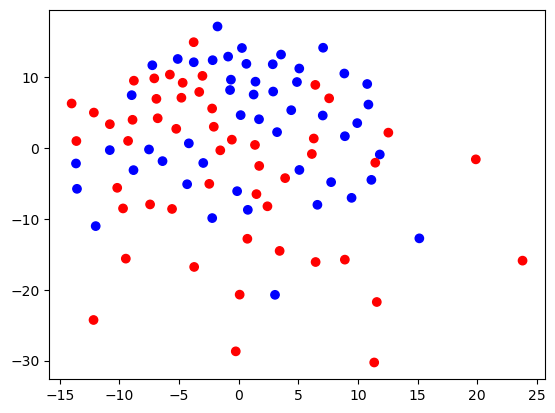

In [56]:
mds = MDS(n_components=2, dissimilarity='precomputed')
embedding = mds.fit_transform(all)

colors = ['blue' for i in range(len(embedding))]
for sub in selected_subjects:
    colors[sub] = 'red'

# Visualize the points with labels in 3D
fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(embedding[:, 0], embedding[:, 1], embedding[:, 2], c=colors)

# # Customize the plot
# ax.set_title('MDS Visualization in 3D with Odd/Even Colors')
# ax.set_xlabel('MDS Dimension 1')
# ax.set_ylabel('MDS Dimension 2')
# ax.set_zlabel('MDS Dimension 3')

plt.scatter(embedding[:, 0], embedding[:, 1], c=colors)

plt.show()